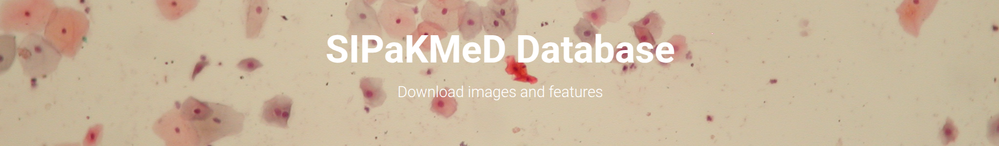

The SIPaKMeD database is publicly available and it can be used for experimental purposes with the request to cite the following paper:

**Marina E. Plissiti, Panagiotis Dimitrakopoulos, Giorgos Sfikas, Christophoros Nikou, Olga Krikoni, Antonia Charchanti, SIPAKMED: A new dataset for feature and image based classification of normal and pathological cervical cells in Pap smear images, IEEE International Conference on Image Processing (ICIP) 2018, Athens, Greece, 7-10 October 2018.**

In [255]:
import os, sys
PROJECT_ROOT = os.path.abspath(os.path.join("../.."))
sys.path.append(PROJECT_ROOT)

PATH = os.path.abspath(os.path.join( "../../"))
sys.path.append(PATH)

PROJECT_PATH = os.path.abspath(os.path.join("../.."))
sys.path.append(PROJECT_PATH)

In [256]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import cv2
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torchvision.models as models
from torchvision.datasets import ImageFolder
from PIL import Image
import torchvision.transforms as transforms
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
import torch.optim as optim         
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import json, logging
import math

from utils.utils import set_seed, get_device, save_history, load_history
from src.uncertainty_Quantification.train import train_model,train_deep_ensemble, get_dataloader
from src.uncertainty_Quantification.test import evaluate_model, evaluate_deep_ensemble, evaluate_mc_dropout
from src.uncertainty_Quantification.models import SingleNetwork, MCDropoutNetwork, DeepEnsemble
from src.uncertainty_Quantification.losses import edl_mse_loss, edl_digamma_loss, edl_log_loss, relu_evidence 
# from src.uncertainty_Quantification.metrics import 
from src.uncertainty_Quantification.models import FineTunedResNet50
from torchcp.classification.score import APS, RAPS, SAPS, KNN, TOPK
from torchcp.classification.predictor import SplitPredictor
from utils.utils import set_seed, enable_dropout
from torchcp.classification.utils.metrics import coverage_rate, average_size, CovGap, VioClasses, SSCV
from src.uncertainty_Quantification.models import SingleNetwork, MCDropoutNetwork, DeepEnsemble
from sklearn.decomposition import PCA



from utils.utils import get_dataloaders
from src.uncertainty_Quantification.test import evaluate_model, monte_carlo_dropout, evaluate_mc_dropout
from netcal.binning import HistogramBinning
from netcal.scaling import TemperatureScaling, BetaCalibration
from netcal.metrics import ECE
from netcal.presentation import ReliabilityDiagram
from utils.utils import enable_dropout, get_device



MODEL_SAVE_PATH = os.path.join(PROJECT_PATH, "outputs/models")
RESULTS_PATH = os.path.join(PROJECT_PATH, "outputs/calibration/")
DEVICE = get_device()
set_seed(42)
EPOCHS = 50
BATCH_SIZE = 32
LEARNING_RATE = 0.0001
PATIENCE =10
ENSEMBLE_SIZE = 10
NUM_SAMPLES = 10

train_loader, val_loader, cal_loader, test_loader = get_dataloaders(batch_size=32, num_workers=4, model_type="resnet")

**01. Load & Explore the Data**

In [8]:

DATASET_PATH = "../../datasets/SIPaKMeD"
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

def load_dataset(dataset_path):
    """
    Loads the dataset by scanning directories for `.bmp` images.
    Returns:
    - file_paths: Dict with class names as keys and list of image paths as values
    - class_counts: Dict with class names as keys and count of images as values
    """
    file_paths = {}
    class_counts = {}

    for class_name in sorted(os.listdir(dataset_path)):  
        class_dir = os.path.join(dataset_path, class_name, "CROPPED")
        if os.path.isdir(class_dir):
            bmp_files = [os.path.join(class_dir, f) for f in os.listdir(class_dir) if f.endswith(".bmp")]
            file_paths[class_name] = bmp_files
            class_counts[class_name] = len(bmp_files)

    return file_paths, class_counts

def visualize_class_distribution(class_counts):
    """
    Plots a bar chart showing class distribution.
    """
    plt.figure(figsize=(8, 6))
    sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")
    plt.title("Class Distribution in SIPaKMeD Dataset")
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=20)
    plt.show()
    
    

def plot_sample_images(file_paths, num_samples=5):
    """
    Plots sample images from each class.
    """
    fig, axes = plt.subplots(len(file_paths), num_samples, figsize=(num_samples * 2, len(file_paths) * 2))

    for i, (class_name, paths) in enumerate(file_paths.items()):
        sample_paths = np.random.choice(paths, num_samples, replace=False) if len(paths) >= num_samples else paths
        for j, img_path in enumerate(sample_paths):
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i, j].imshow(img)
            axes[i, j].axis("off")
            if j == 0:
                axes[i, j].set_title(class_name, fontsize=12, fontweight="bold")
    
    plt.tight_layout()
    plt.show()


Class Counts: {'im_Dyskeratotic': 813, 'im_Koilocytotic': 825, 'im_Metaplastic': 793, 'im_Parabasal': 787, 'im_Superficial-Intermediate': 831}


/tmp/ipykernel_1207333/1747648437.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")


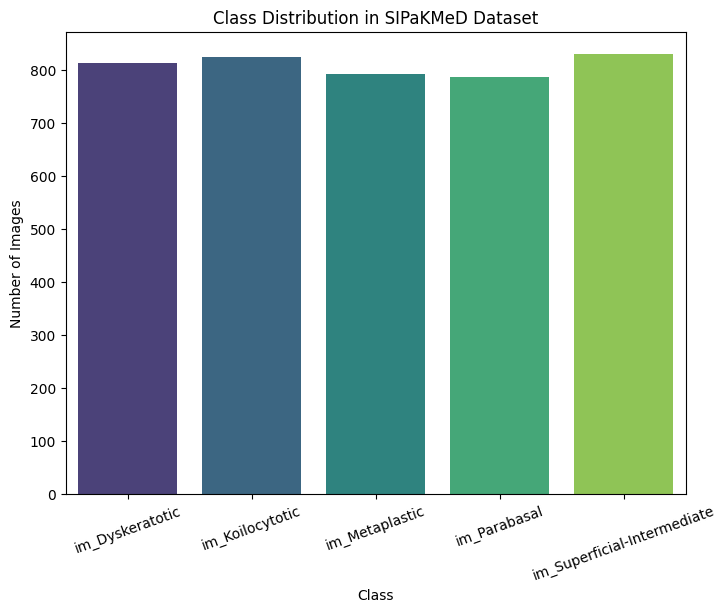

In [9]:
file_paths, class_counts = load_dataset(DATASET_PATH)
print(f"Class Counts: {class_counts}")
visualize_class_distribution(class_counts)


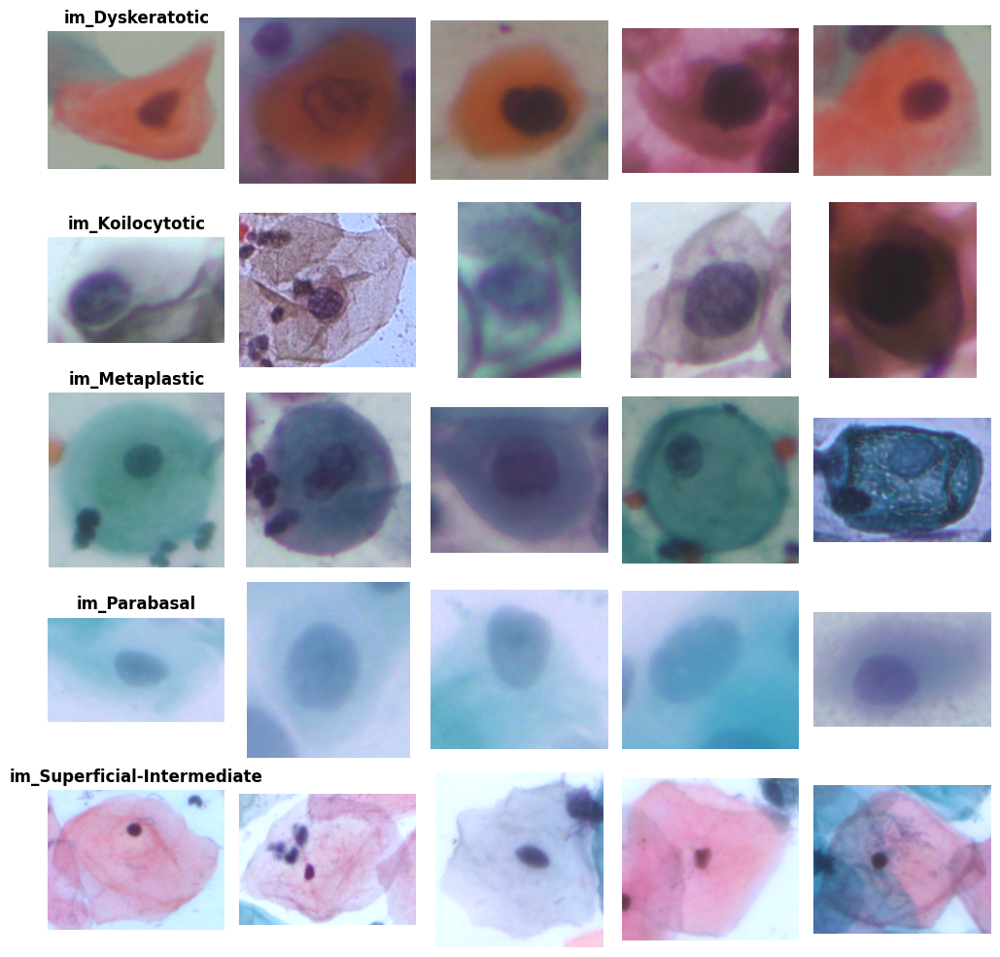

In [10]:
plot_sample_images(file_paths, num_samples=5)

In [ ]:

dropout_rate = 0.5
learning_rate = 0.0005
num_epochs = 50
num_samples, ensemble_size = 10, 10

finetuned_model = FineTunedResNet50(num_classes=5, mc_dropout=False, dropout_rate=dropout_rate)
# model_path = PATH + "/outputs/models/SingleNetwork_finetuned_resnet50.pth"
# model.load_state_dict(torch.load(model_path))
optimizer = optim.Adam(finetuned_model.parameters(), lr=learning_rate, weight_decay=1e-5)
criterion = nn.CrossEntropyLoss()
train_model(finetuned_model, train_loader, val_loader, criterion, optimizer, epochs=num_epochs, model_name="SingleNetwork_finetuned_resnet50", patience=10)
res_single_resnet50 = evaluate_model(finetuned_model, test_loader, model_name="SingleNetwork_finetuned_resnet50")
print(f"Single Network ResNet50 Test Performance: {res_single_resnet50}")


**Step 01**

**Finetuning**

In [ ]:
class FineTunedResNet50(nn.Module):
    def __init__(self, num_classes, pretrained=True, mc_dropout=False, dropout_rate=0.5):
        super(FineTunedResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        
        for param in self.model.parameters():
            param.requires_grad = False
        for param in self.model.layer4.parameters():
            param.requires_grad = True
        
        self.model.fc = nn.Sequential(
            nn.Dropout(dropout_rate) if mc_dropout else nn.Identity(),
            nn.Linear(self.model.fc.in_features, 1024),
            nn.ReLU(),
            nn.Linear(1024, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )
    
    def forward(self, x):
        return self.model(x)


num_classes = 5
dropout_rate = 0.5
learning_rate = 0.0001
num_epochs = 50

from utils.utils import get_dataloaders
from src.uncertainty_Quantification.train import train_model
from src.uncertainty_Quantification.test import evaluate_model


train_loader, val_loader, cal_loader, test_loader = get_dataloaders(batch_size=32, num_workers=4, model_type="resnet")

resnet50_model = FineTunedResNet50(num_classes=num_classes, mc_dropout=False)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet50_model.parameters()), lr=learning_rate)
train_model(resnet50_model, train_loader, val_loader, criterion, optimizer, num_epochs, "SipakmedFineTunedResNet50")
# torch.save(resnet50_model.state_dict(), MODEL_SAVE_PATH)
# print(f"Model saved at: {MODEL_SAVE_PATH}")

# Load Model for Evaluation
MODEL_SAVE_PATH = os.path.join(PROJECT_ROOT, "outputs/models/SipakmedFineTunedResNet50.pth")
resnet50_model.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location="cuda" if torch.cuda.is_available() else "cpu"))
# Evaluate Model
res_resnet50 = evaluate_model(resnet50_model, test_loader, "SipakmedFineTunedResNet50")
print(f"Fine-Tuned ResNet50 Test Performance: {res_resnet50}")


In [56]:

#=====================
# monte carlo dropout
#=====================
resnet50_mcd = FineTunedResNet50(num_classes=num_classes, mc_dropout=True, dropout_rate=dropout_rate)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet50_mcd.parameters()), lr=learning_rate)
train_model(resnet50_mcd, train_loader, val_loader, criterion, optimizer, num_epochs, "SipakmedFineTunedResNet50_MCD")
# load model for evaluation
MODEL_SAVE_PATH = os.path.join(PROJECT_ROOT, "outputs/models/SipakmedFineTunedResNet50_MCD.pth")
resnet50_mcd.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location="cuda" if torch.cuda.is_available() else "cpu"))
res_resnet50_mcd = evaluate_mc_dropout(resnet50_mcd, test_loader, "SipakmedFineTunedResNet50_MCD", n_samples=10)
print(f"Fine-Tuned ResNet50 MC Dropout Test Performance: {res_resnet50_mcd}")

/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:SipakmedFineTunedResNet50_MCD:Starting training for SipakmedFineTunedResNet50_MCD
/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Training SipakmedFineTunedResNet50_MCD for 50 epochs


Training SipakmedFineTunedResNet50_MCD Epoch 1/50: 100%|██████████| 95/95 [00:38<00:00,  2.47it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 1/50 | Train Loss: 0.5266 | Val Loss: 1.0152 | Val Acc: 0.9342 | Val F1: 0.9329 | Val Recall: 0.9342 | Val Precision: 0.9356
INFO:SipakmedFineTunedResNet50_MCD:Validation loss decreased to 1.0152. Saving model...


Epoch 1/50 | Train Loss: 0.5266 | Val Loss: 1.0152 | Val Acc: 0.9342 | Val F1: 0.9329 | Val Recall: 0.9342 | Val Precision: 0.9356


Training SipakmedFineTunedResNet50_MCD Epoch 2/50: 100%|██████████| 95/95 [00:39<00:00,  2.41it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 2/50 | Train Loss: 0.0990 | Val Loss: 0.9161 | Val Acc: 0.9474 | Val F1: 0.9468 | Val Recall: 0.9474 | Val Precision: 0.9473
INFO:SipakmedFineTunedResNet50_MCD:Validation loss decreased to 0.9161. Saving model...


Epoch 2/50 | Train Loss: 0.0990 | Val Loss: 0.9161 | Val Acc: 0.9474 | Val F1: 0.9468 | Val Recall: 0.9474 | Val Precision: 0.9473


Training SipakmedFineTunedResNet50_MCD Epoch 3/50: 100%|██████████| 95/95 [00:39<00:00,  2.39it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 3/50 | Train Loss: 0.0293 | Val Loss: 1.3174 | Val Acc: 0.9342 | Val F1: 0.9332 | Val Recall: 0.9342 | Val Precision: 0.9406
INFO:SipakmedFineTunedResNet50_MCD:No improvement for 1 epochs


Epoch 3/50 | Train Loss: 0.0293 | Val Loss: 1.3174 | Val Acc: 0.9342 | Val F1: 0.9332 | Val Recall: 0.9342 | Val Precision: 0.9406


Training SipakmedFineTunedResNet50_MCD Epoch 4/50: 100%|██████████| 95/95 [00:39<00:00,  2.38it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 4/50 | Train Loss: 0.0342 | Val Loss: 1.1528 | Val Acc: 0.9408 | Val F1: 0.9400 | Val Recall: 0.9408 | Val Precision: 0.9409
INFO:SipakmedFineTunedResNet50_MCD:No improvement for 2 epochs


Epoch 4/50 | Train Loss: 0.0342 | Val Loss: 1.1528 | Val Acc: 0.9408 | Val F1: 0.9400 | Val Recall: 0.9408 | Val Precision: 0.9409


Training SipakmedFineTunedResNet50_MCD Epoch 5/50: 100%|██████████| 95/95 [00:40<00:00,  2.36it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 5/50 | Train Loss: 0.0197 | Val Loss: 1.0363 | Val Acc: 0.9605 | Val F1: 0.9603 | Val Recall: 0.9605 | Val Precision: 0.9609
INFO:SipakmedFineTunedResNet50_MCD:No improvement for 3 epochs


Epoch 5/50 | Train Loss: 0.0197 | Val Loss: 1.0363 | Val Acc: 0.9605 | Val F1: 0.9603 | Val Recall: 0.9605 | Val Precision: 0.9609


Training SipakmedFineTunedResNet50_MCD Epoch 6/50: 100%|██████████| 95/95 [00:40<00:00,  2.34it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 6/50 | Train Loss: 0.0128 | Val Loss: 1.2209 | Val Acc: 0.9605 | Val F1: 0.9600 | Val Recall: 0.9605 | Val Precision: 0.9609
INFO:SipakmedFineTunedResNet50_MCD:No improvement for 4 epochs


Epoch 6/50 | Train Loss: 0.0128 | Val Loss: 1.2209 | Val Acc: 0.9605 | Val F1: 0.9600 | Val Recall: 0.9605 | Val Precision: 0.9609


Training SipakmedFineTunedResNet50_MCD Epoch 7/50: 100%|██████████| 95/95 [00:40<00:00,  2.33it/s]
INFO:SipakmedFineTunedResNet50_MCD:Epoch 7/50 | Train Loss: 0.0026 | Val Loss: 1.2176 | Val Acc: 0.9539 | Val F1: 0.9535 | Val Recall: 0.9539 | Val Precision: 0.9545
INFO:SipakmedFineTunedResNet50_MCD:No improvement for 5 epochs
INFO:SipakmedFineTunedResNet50_MCD:Early stopping triggered after 7 epochs
/tmp/ipykernel_41643/3326424509.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded vi

Epoch 7/50 | Train Loss: 0.0026 | Val Loss: 1.2176 | Val Acc: 0.9539 | Val F1: 0.9535 | Val Recall: 0.9539 | Val Precision: 0.9545
Training complete for SipakmedFineTunedResNet50_MCD


/home/conite/Documents/STAGE/HybridUncertaintyAwareDL/src/uncertainty_Quantification/test.py:347: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.l

Fine-Tuned ResNet50 MC Dropout Test Performance: {'model': 'SipakmedFineTunedResNet50_MCD', 'accuracy': 0.9556650246305419, 'precision': 0.9558749129954671, 'recall': 0.9555601415776293, 'f1_score': 0.9556127086353114, 'auc': 0.9971931784514799, 'uncertainties': array([2.36574649e-10, 5.87236585e-13, 4.76324402e-09, 4.62399155e-04,
       4.20348290e-09, 1.71402490e-07, 2.22918242e-02, 1.15174839e-14,
       9.78351181e-06, 1.21346988e-10, 3.42218950e-02, 1.51510395e-08,
       5.46244994e-11, 1.92522977e-11, 1.19351456e-11, 1.37383751e-07,
       7.65900873e-03, 4.85482488e-12, 7.79995872e-08, 3.29288312e-08,
       2.33811716e-17, 4.65854785e-11, 3.18426519e-14, 1.80574231e-18,
       2.94702695e-05, 2.40662407e-10, 2.21080685e-04, 3.77497054e-06,
       1.51013053e-04, 5.07936929e-04, 2.08846685e-18, 3.52640443e-12,
       8.06703859e-09, 7.28487992e-10, 4.32982833e-13, 9.10900333e-09,
       6.02446260e-10, 3.57689394e-04, 1.95804994e-09, 2.77600460e-11,
       5.51932035e-13, 2.45

In [ ]:

class FineTunedResNet50(nn.Module):
    def __init__(self, num_classes, pretrained=True, mc_dropout=False, dropout_rate=0.5):
        super(FineTunedResNet50, self).__init__()
        self.model = models.resnet50(pretrained=pretrained)
        
        for param in self.model.parameters():
            param.requires_grad = False
        for param in self.model.layer4.parameters():
            param.requires_grad = True
        
        self.model.fc = nn.Sequential(
            nn.Dropout(dropout_rate) if mc_dropout else nn.Identity(),
            nn.Linear(self.model.fc.in_features, 1024),
            nn.ReLU(),
            nn.Linear(1024, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )
    
    def forward(self, x):
        return self.model(x)

# Paths
# MODEL_SAVE_PATH = os.path.join(PROJECT_ROOT, "outputs/models/FineTunedResNet50.pth")
# Hyperparameters
num_classes = 5
dropout_rate = 0.4
learning_rate = 0.0001
num_epochs = 50

from utils.utils import get_dataloaders
from src.uncertainty_Quantification.train import train_model
from src.uncertainty_Quantification.test import evaluate_model


train_loader, val_loader, cal_loader, test_loader = get_dataloaders(batch_size=32, num_workers=4, model_type="resnet")
# Deep Ensemble
ensemble_size = 10
ensemble_models = [FineTunedResNet50(num_classes=num_classes, mc_dropout=False) for _ in range(ensemble_size)]
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, ensemble_models[0].parameters()), lr=learning_rate)

ensemble_models = [
    train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs, f"FineTunedResNet50_{i}")
    for i, model in enumerate(ensemble_models)
]


/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
INFO:FineTunedResNet50_0:Starting training for FineTunedResNet50_0


Training FineTunedResNet50_0 for 50 epochs


Training FineTunedResNet50_0 Epoch 1/50: 100%|██████████| 95/95 [04:06<00:00,  2.60s/it]
INFO:FineTunedResNet50_0:Epoch 1/50 | Train Loss: 43.6396 | Val Loss: 1.0184 | Val Acc: 0.9408 | Val F1: 0.9392 | Val Recall: 0.9408 | Val Precision: 0.9419
INFO:FineTunedResNet50_0:Validation loss decreased to 1.0184. Saving model...


Epoch 1/50 | Train Loss: 43.6396 | Val Loss: 1.0184 | Val Acc: 0.9408 | Val F1: 0.9392 | Val Recall: 0.9408 | Val Precision: 0.9419


Training FineTunedResNet50_0 Epoch 2/50: 100%|██████████| 95/95 [04:36<00:00,  2.91s/it]
INFO:FineTunedResNet50_0:Epoch 2/50 | Train Loss: 7.9643 | Val Loss: 0.7952 | Val Acc: 0.9671 | Val F1: 0.9667 | Val Recall: 0.9671 | Val Precision: 0.9671
INFO:FineTunedResNet50_0:Validation loss decreased to 0.7952. Saving model...


Epoch 2/50 | Train Loss: 7.9643 | Val Loss: 0.7952 | Val Acc: 0.9671 | Val F1: 0.9667 | Val Recall: 0.9671 | Val Precision: 0.9671


Training FineTunedResNet50_0 Epoch 3/50: 100%|██████████| 95/95 [04:13<00:00,  2.66s/it]
INFO:FineTunedResNet50_0:Epoch 3/50 | Train Loss: 2.7772 | Val Loss: 0.9484 | Val Acc: 0.9671 | Val F1: 0.9668 | Val Recall: 0.9671 | Val Precision: 0.9671
INFO:FineTunedResNet50_0:No improvement for 1 epochs


Epoch 3/50 | Train Loss: 2.7772 | Val Loss: 0.9484 | Val Acc: 0.9671 | Val F1: 0.9668 | Val Recall: 0.9671 | Val Precision: 0.9671


Training FineTunedResNet50_0 Epoch 4/50: 100%|██████████| 95/95 [05:40<00:00,  3.58s/it]
INFO:FineTunedResNet50_0:Epoch 4/50 | Train Loss: 2.2024 | Val Loss: 1.1308 | Val Acc: 0.9408 | Val F1: 0.9399 | Val Recall: 0.9408 | Val Precision: 0.9410
INFO:FineTunedResNet50_0:No improvement for 2 epochs


Epoch 4/50 | Train Loss: 2.2024 | Val Loss: 1.1308 | Val Acc: 0.9408 | Val F1: 0.9399 | Val Recall: 0.9408 | Val Precision: 0.9410


Training FineTunedResNet50_0 Epoch 5/50: 100%|██████████| 95/95 [06:03<00:00,  3.83s/it]
INFO:FineTunedResNet50_0:Epoch 5/50 | Train Loss: 2.0043 | Val Loss: 1.0673 | Val Acc: 0.9539 | Val F1: 0.9535 | Val Recall: 0.9539 | Val Precision: 0.9537
INFO:FineTunedResNet50_0:No improvement for 3 epochs


Epoch 5/50 | Train Loss: 2.0043 | Val Loss: 1.0673 | Val Acc: 0.9539 | Val F1: 0.9535 | Val Recall: 0.9539 | Val Precision: 0.9537


Training FineTunedResNet50_0 Epoch 6/50: 100%|██████████| 95/95 [05:50<00:00,  3.69s/it]
INFO:FineTunedResNet50_0:Epoch 6/50 | Train Loss: 1.2165 | Val Loss: 0.9196 | Val Acc: 0.9737 | Val F1: 0.9734 | Val Recall: 0.9737 | Val Precision: 0.9736
INFO:FineTunedResNet50_0:No improvement for 4 epochs


Epoch 6/50 | Train Loss: 1.2165 | Val Loss: 0.9196 | Val Acc: 0.9737 | Val F1: 0.9734 | Val Recall: 0.9737 | Val Precision: 0.9736


Training FineTunedResNet50_0 Epoch 7/50:  31%|███       | 29/95 [02:22<05:17,  4.81s/it]

In [11]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

def visualize_single_performance(model_name="FineTunedResNet50"):
    history_path = os.path.join(PROJECT_ROOT, 'outputs', 'results', f"{model_name}_history.json") 
    history_df = load_history(history_path)
    
    metrics = ["train_loss", "val_loss", "val_acc", "val_f1", "val_recall", "val_precision"]
    num_cols = 2
    num_rows = 1

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))
    axs = axs.flatten()

    # Plot train and validation loss in the left subplot
    print(history_df.columns)
    axs[0].plot(history_df.index, history_df["train_loss"], label="Train Loss")
    axs[0].plot(history_df.index, history_df["val_loss"], label="Validation Loss")
    axs[0].set_title("Loss")
    axs[0].set_xlabel("Epochs")
    axs[0].set_ylabel("Loss")
    axs[0].legend()
    axs[0].grid(True)

    # Plot accuracy, F1, recall, and precision in the right subplot
    for metric in ["val_acc", "val_f1", "val_recall", "val_precision"]:
        if metric in history_df:
            axs[1].plot(history_df.index, history_df[metric], label=metric.replace("val_", "").title())
    axs[1].set_title("Validation Metrics")
    axs[1].set_xlabel("Epochs")
    axs[1].set_ylabel("Score")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()


def plot_confusion_matrix(model_names=["FineTunedResNet50"], test_loader=None):
    fig, axes = plt.subplots(1, len(model_names), figsize=(len(model_names) * 6, 6))

    if len(model_names) == 1:
        axes = [axes]
    
    for i, model_name in enumerate(model_names):
        # Load the model
        model_path = os.path.join(PROJECT_ROOT, "outputs/models", f"{model_name}.pth")
        model = FineTunedResNet50(num_classes=5)
        model.load_state_dict(torch.load(model_path, map_location=DEVICE))
        model.to(DEVICE)
        model.eval()
        
        y_true, y_pred = [], []
        for X_batch, y_batch in test_loader:
            X_batch, y_batch = X_batch.to(DEVICE), y_batch.to(DEVICE)
            with torch.no_grad():
                preds = model(X_batch)
                y_true.extend(y_batch.cpu().numpy())
                y_pred.extend(preds.argmax(dim=1).cpu().numpy())
        
        cm = confusion_matrix(y_true, y_pred)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        
        disp.plot(cmap=plt.cm.Blues, ax=axes[i])
        axes[i].set_title(f"Confusion Matrix for {model_name}")
    plt.tight_layout()
    plt.show()


**Single Network**

In [12]:
DEVICE



device(type='cuda')

Index(['train_loss', 'train_acc', 'val_loss', 'val_acc', 'val_f1',
       'val_recall', 'val_precision'],
      dtype='object')


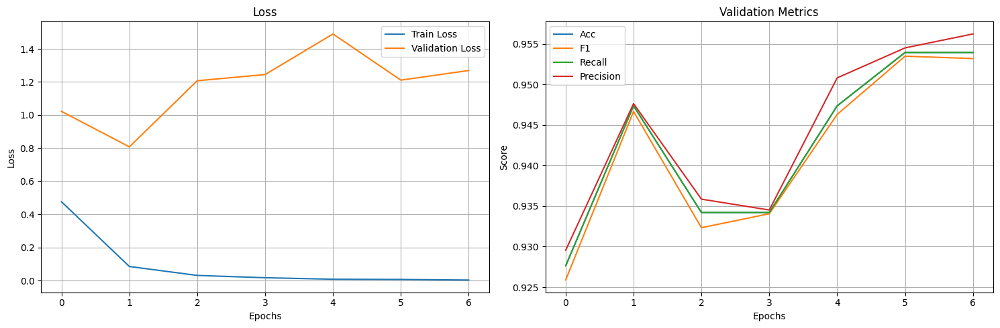

/tmp/ipykernel_28079/557029401.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  finetuned_model_single.load_state_dict(torch.load(os.path.join(PROJECT_ROOT, "outputs/mode

Single model performance: {'model': 'SipakmedFineTunedResNet50', 'accuracy': 0.958128078817734, 'precision': 0.9580970023081786, 'recall': 0.9582424803359173, 'f1_score': 0.9581556767376446, 'auc': 0.9738845977078194}


In [13]:
visualize_single_performance(model_name="SipakmedFineTunedResNet50")
finetuned_model_single = FineTunedResNet50(num_classes=5, mc_dropout=False)
finetuned_model_single.to(DEVICE)
finetuned_model_single.load_state_dict(torch.load(os.path.join(PROJECT_ROOT, "outputs/models/SipakmedFineTunedResNet50.pth"), map_location=DEVICE))
results_finetuned_resnet50 = evaluate_model( finetuned_model_single, test_loader, "SipakmedFineTunedResNet50")
print(f"Single model performance: {results_finetuned_resnet50}")

/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_28079/1048026293.py:48: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/bl

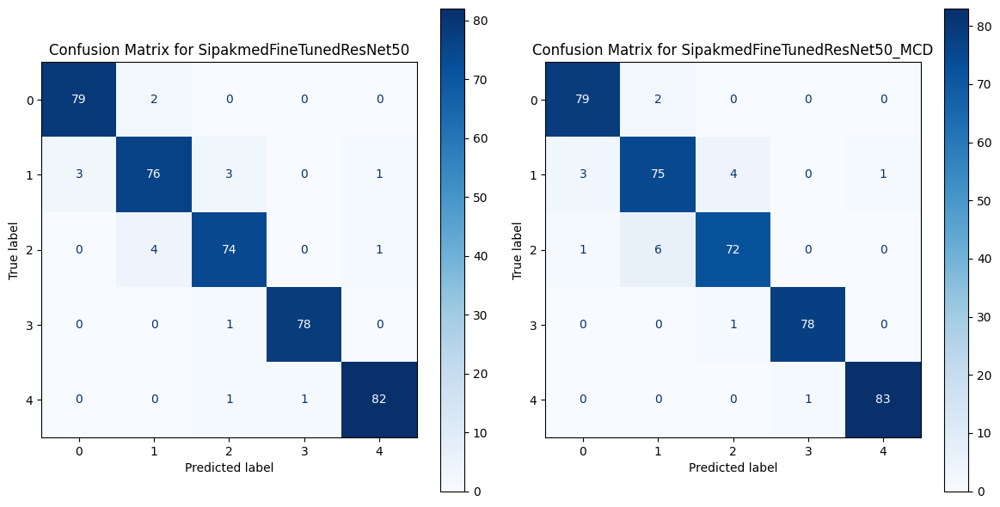

In [14]:
plot_confusion_matrix(model_names=["SipakmedFineTunedResNet50", "SipakmedFineTunedResNet50_MCD"], test_loader=test_loader)

**Step 02**

In [15]:
def evaluate_with_calibration(model_type, dataloader, device, method="histogram", bins=10, args=None, fineturned_model=False, num_classes=5, model=None):
    """
    Evaluate model calibration using different methods and display results in a row with 3 columns.

    Args:
        model_type (str): Model type ("single", "deep_ensemble", "mc_dropout").
        dataloader (torch.utils.data.DataLoader): DataLoader for test dataset.
        device (torch.device): Device to run the model on.
        methods (list): List of calibration methods to use.
        bins (int): Number of bins for binning-based calibration.
        args (dict or None): Additional parameters for deep ensemble and MC Dropout.

    Returns:
        None
    """
    all_preds, all_labels = [], []
    MODEL_SAVE_PATH = os.path.join(PROJECT_ROOT, "outputs/models/")
    
    if model_type == "single":
        if not model:
            model = SingleNetwork().to(device) if not fineturned_model else FineTunedResNet50(num_classes=num_classes).to(device) 
            model.load_state_dict(torch.load(os.path.join(MODEL_SAVE_PATH, "SipakmedSingleNetwork.pth"), map_location=device))
            model.eval()
        else:
            model.eval()
            
        for X_batch, y_batch in dataloader:
            X_batch = X_batch.to(device)
            with torch.no_grad():
                preds = torch.softmax(model(X_batch), dim=1)
            all_preds.append(preds.cpu().numpy())
            all_labels.append(y_batch.cpu().numpy())

    elif model_type == "deep_ensemble":
        models = []
        ensemble_size = args.get("ensemble_size", 5) if args else 5

        for i in range(ensemble_size):
            model = SingleNetwork().to(device) if not fineturned_model else FineTunedResNet50(num_classes=num_classes).to(device)
            model_path = os.path.join(MODEL_SAVE_PATH, f"SipakmedDeepEnsemble_{i}.pth")
            if not os.path.exists(model_path):
                print(f"Missing Deep Ensemble model: {model_path}")
                continue
            model.load_state_dict(torch.load(model_path, map_location=device))
            model.eval()
            models.append(model)

        for X_batch, y_batch in dataloader:
            X_batch = X_batch.to(device)
            with torch.no_grad():
                preds = torch.stack([torch.softmax(model(X_batch), dim=1) for model in models])
                mean_preds = preds.mean(dim=0)
            all_preds.append(mean_preds.cpu().numpy())
            all_labels.append(y_batch.cpu().numpy())

    # 🔹 Load MC Dropout
    elif model_type == "mc_dropout":
        if not model:
            model = MCDropoutNetwork().to(device) if not fineturned_model else FineTunedResNet50(mc_dropout=True, num_classes=num_classes).to(device)
            model.load_state_dict(torch.load(os.path.join(MODEL_SAVE_PATH, "SipaknedMCDropout.pth"), map_location=device))
            model.eval()
        else:
            model.eval()
        enable_dropout(model) 

        num_samples = args.get("num_samples", 50) if args else 50  # Default num_samples

        for X_batch, y_batch in dataloader:
            X_batch = X_batch.to(device)
            with torch.no_grad():
                preds = torch.stack([torch.softmax(model(X_batch), dim=1) for _ in range(num_samples)])
                mean_preds = preds.mean(dim=0)
            all_preds.append(mean_preds.cpu().numpy())
            all_labels.append(y_batch.cpu().numpy())

    else:
        raise ValueError(f"Invalid model type: {model_type}")

    all_preds = np.concatenate(all_preds, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    # 🔹 Compare Calibration Methods
    ece_scores = {}
    figs = []
    methods = {
        "histogram": HistogramBinning(bins=bins),
        # "temperature_scaling": TemperatureScaling(),
        # "beta_calibration": BetaCalibration()    
    }
    
    
    for method_name, method in methods.items():
        method.fit(all_preds, all_labels)
        calibrated_preds = method.transform(all_preds)
        ece = ECE(bins=bins)
        ece_val = ece.measure(calibrated_preds, all_labels)
        ece_scores[method_name] = ece_val

        # 🔹 Generate Reliability Diagram
        fig = plt.figure(figsize=(8, 6))
        reliability_diagram = ReliabilityDiagram()
        reliability_diagram.plot(calibrated_preds, all_labels, ax=plt.gca(), fig=fig)
        figs.append(fig)
    
    return ece_scores, figs
    

/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_28079/1880440310.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blo

({'histogram': 0.004674382838122384}, [<Figure size 800x600 with 3 Axes>])

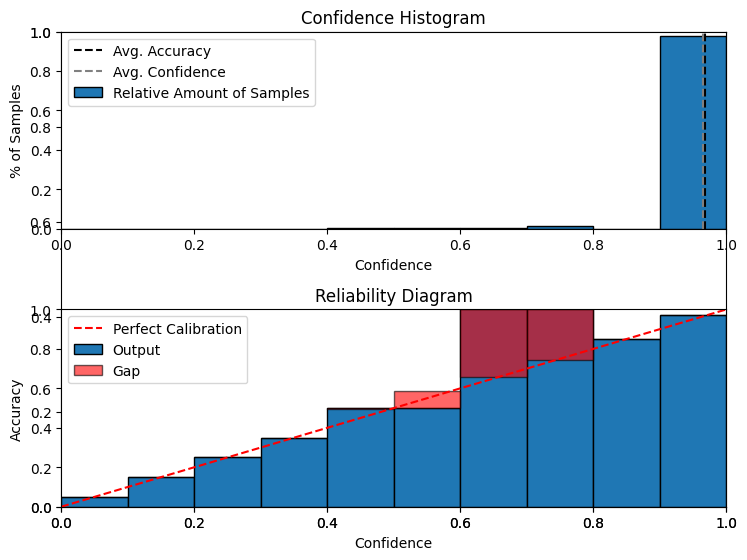

In [16]:
# load models finetuned
finetuned_model_single = FineTunedResNet50(num_classes=5, mc_dropout=False)
finetuned_model_single.load_state_dict(torch.load(os.path.join(MODEL_SAVE_PATH, "SipakmedFineTunedResNet50.pth"), map_location=DEVICE))
finetuned_model_single.to(DEVICE)
evaluate_with_calibration(
    model=finetuned_model_single, model_type="single", dataloader=test_loader, device=DEVICE, method="histogram", bins=10, num_classes=5
)

/tmp/ipykernel_28079/1158434537.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  finetuned_model_mcd.load_state_dict(torch.load(os.path.join(MODEL_SAVE_PATH, "SipakmedFin

({'histogram': 0.005181423989422736}, [<Figure size 800x600 with 3 Axes>])

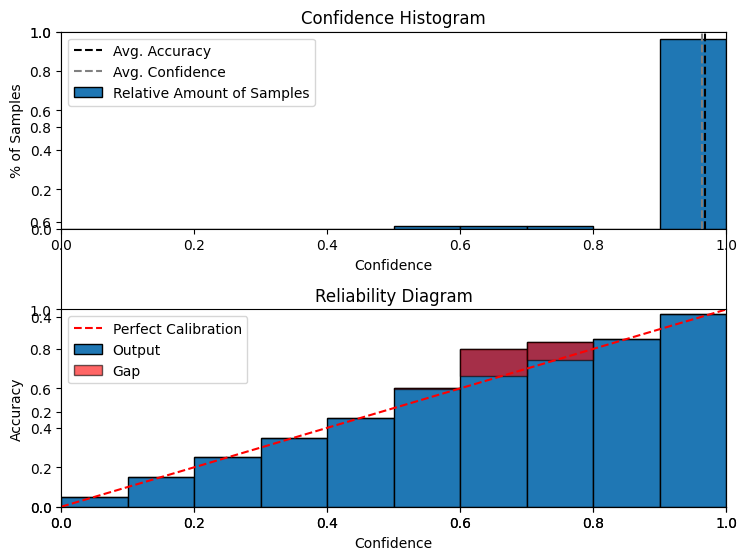

In [17]:
finetuned_model_mcd = FineTunedResNet50(num_classes=5, mc_dropout=True)
MODEL_SAVE_PATH = os.path.join(PROJECT_ROOT, "outputs/models/")

finetuned_model_mcd.load_state_dict(torch.load(os.path.join(MODEL_SAVE_PATH, "SipakmedFineTunedResNet50_MCD.pth"), map_location=DEVICE))
finetuned_model_mcd.to(DEVICE)
evaluate_with_calibration(
    model=finetuned_model_mcd, model_type="mc_dropout", dataloader=test_loader, device=DEVICE, method="histogram", bins=10, num_classes=5, args={'num_samples':10}
)

**Step 3**

* Get logits, labels

* Implements APS, SAPS, RAPS

In [115]:
import torch
import torch.nn.functional as F
import numpy as np

def get_probs_and_labels(model, dataloader, device, mc_dropout=False, T=10, models=None):
    model.eval()
    all_probs = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            
            if mc_dropout:
                mc_outputs = []
                model.train()
                for _ in range(T):
                    outputs = model(inputs)
                    mc_outputs.append(F.softmax(outputs, dim=1).cpu().numpy())
                probs = np.mean(np.stack(mc_outputs, axis=0), axis=0)
                model.eval() 
            elif models:
                mc_outputs = []
                for model in models:
                    outputs = model(inputs)
                    mc_outputs.append(F.softmax(outputs, dim=1).cpu().numpy())
                probs = np.mean(np.stack(mc_outputs, axis=0), axis=0)
            else:
                outputs = model(inputs)
                probs = F.softmax(outputs, dim=1).cpu().numpy()
            
            all_probs.append(probs)
            all_labels.append(labels.cpu().numpy())

    all_probs = np.concatenate(all_probs, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    return all_probs, all_labels

#================
# APS
#================


def apply_aps(probs_cal, y_cal, probs_test, y_test, alpha=0.1, verbose=False, empty_set=True):
    """
    Applies APS conformal prediction method.
    Returns prediction sets, and correctness info.
    """
    n = len(probs_test)
    prediction_sets = []
    correct = []
    sizes = []

    cal_scores = 1 - probs_cal[np.arange(len(y_cal)), y_cal]
    q_hat = np.quantile(cal_scores, 1 - alpha)

    for i in range(n):
        prob_i = probs_test[i]
        set_i = np.where(1 - prob_i <= q_hat)[0].tolist()
        
        if not empty_set and len(set_i) == 0:
            set_i = [int(np.argmax(prob_i))]
        prediction_sets.append(set_i)
        sizes.append(len(set_i))
        correct.append(y_test[i] in set_i)

    return prediction_sets, correct, sizes, q_hat


#===================
# RAPS
#===================
def raps_calibration(probs_cal, y_cal, lambda_reg=0.1, k_reg=1, alpha=0.1):
    """
    Étape de calibration : calcul du seuil τ_hat à partir du jeu de calibration.
    """
    n = len(y_cal)
    E = []
    
    for i in range(n):
        prob = probs_cal[i]
        label = y_cal[i]
        sorted_idx = np.argsort(-prob)
        sorted_probs = prob[sorted_idx]
        rank = np.where(sorted_idx == label)[0][0]
        score = np.sum(sorted_probs[:rank+1]) + lambda_reg * max(0, rank - k_reg + 1)
        E.append(score)
    
    tau_hat = np.quantile(E, 1 - alpha)
    # print(f"Scores calibrés E = {np.round(E, 3)}")
    print(f"Seuil τ̂_cal = {tau_hat:.3f}")
    
    return tau_hat


def raps_predict_set(probs_test, tau_hat, lambda_reg=0.1, k_reg=1, randomized=True):
    prediction_sets = []
    sizes = []

    for i, prob in enumerate(probs_test):
        sorted_idx = np.argsort(-prob)
        sorted_probs = prob[sorted_idx]

        cum_score = 0
        L = 0

        while L < len(sorted_probs):
            penalty = lambda_reg * max(0, L - k_reg + 1)
            temp_score = cum_score + sorted_probs[L] + penalty
            if temp_score > tau_hat:
                break
            cum_score += sorted_probs[L]
            L += 1

        if randomized and L < len(sorted_probs):
            u = np.random.uniform(0, 1)
            penalty_L = lambda_reg * max(0, L - k_reg + 1)
            temp_score = cum_score + sorted_probs[L] + penalty_L
            prob_include = (tau_hat - cum_score) / (sorted_probs[L] + penalty_L)
            if u <= prob_include:
                L += 1

        selected_classes = sorted_idx[:L].tolist()
        prediction_sets.append(selected_classes)
        sizes.append(L)

        print(f"\nTest {i}:")
        print(f"  Sorted probs = {np.round(sorted_probs, 3)}")
        print(f"  Prediction set (idx) = {selected_classes}")
        print(f"  Set size = {L}")
    
    return prediction_sets, sizes


def tune_raps_saps(probs_cal, y_cal, probs_test, y_test, alpha=0.1, method="saps"):
    lambdas = [0.0, 0.01, 0.1, 0.2, 0.5, 1.0]
    k_regs = [0.5, 0.75, 1, 2, 5] if method.lower() == "raps" else [2]  

    best = None
    results = []

    for lam in lambdas:
        for kreg in k_regs:
            if method.lower() == "raps":
                tau_hat = raps_calibration(probs_cal, y_cal, lambda_reg=lam, k_reg=kreg, alpha=alpha)
                prediction_sets, sizes = raps_predict_set(probs_test, tau_hat, lambda_reg=lam, k_reg=kreg)
                correct = [int(y) in s for y, s in zip(y_test, prediction_sets)]
            elif method.lower() == "saps":
                prediction_sets, correct, sizes, tau_hat = apply_saps(
                    probs_cal=probs_cal,
                    y_cal=y_cal,
                    probs_test=probs_test,
                    y_test=y_test,
                    alpha=alpha,
                    lambda_reg=lam,
                    randomized=True,
                    verbose=False
                )
            else:
                print(f"Unknown method: {method}")
                continue

            coverage = np.mean(correct)
            avg_size = np.mean(sizes)

            results.append({
                "method": method.upper(),
                "lambda": lam,
                "kreg": kreg,
                "coverage": coverage,
                "avg_size": avg_size,
                "tau_hat": tau_hat,
                "prediction_sets": prediction_sets,
                "sizes": sizes
            })

            print(f"Method={method.upper()}, λ={lam:.2f}, kreg={kreg}, coverage={coverage:.3f}, avg size={avg_size:.2f}")

            if best is None or (coverage >= 1 - alpha and avg_size < best['avg_size']):
                best = results[-1]

    return best, results


def plot_raps_saps_summary(results, alpha=0.1):
    """
    Visualize average set size and coverage across (λ, k_reg) for RAPS.
    """
    method = results[0]["method"]
    df = pd.DataFrame(results)

    pivot_size = df.pivot(index="lambda", columns="kreg", values="avg_size")
    pivot_coverage = df.pivot(index="lambda", columns="kreg", values="coverage")

    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

    sns.heatmap(pivot_size, annot=True, fmt=".2f", cmap="Blues", ax=axs[0])
    axs[0].set_title("Average Set Size")
    axs[0].set_xlabel("k_reg")
    axs[0].set_ylabel("λ")

    sns.heatmap(pivot_coverage, annot=True, fmt=".2f", cmap="YlGn", ax=axs[1],
                vmin=1 - alpha - 0.05, vmax=1.0)
    axs[1].set_title(f"Coverage (Target ≥ {1 - alpha:.2f})")
    axs[1].set_xlabel("k_reg")
    axs[1].set_ylabel("λ")

    plt.suptitle(f"{method} Hyperparameter Tuning Summary", fontsize=14)
    plt.tight_layout()
    plt.show()


#===================
# SAPS
#===================
import torch


def saps_calibration(probs_cal, y_cal, lambda_reg=0.1, randomized=True, alpha=0.1):
    """
    Calibration step: compute the threshold τ_hat from the calibration set.
    """
    scores_cal = compute_saps_scores(probs_cal, y_cal, lambda_reg, randomized)
    n_cal = len(scores_cal)
    rank = int(torch.ceil(torch.tensor((1 - alpha) * (n_cal + 1))) - 1)
    rank = min(max(rank, 0), n_cal - 1)
    q_hat = torch.sort(scores_cal)[0][rank].item()
    return q_hat
    
def compute_saps_scores(probs, labels=None, lambda_reg=0.1, randomized=True):
    """
    Compute SAPS non-conformity scores for calibration or testing.

    Args:
        probs (torch.Tensor): shape (n_samples, n_classes)
        labels (torch.Tensor or None): true labels for calibration, or None for test mode
        lambda_reg (float): λ parameter for SAPS
        randomized (bool): use u ~ U[0,1] for randomized tie-breaking

    Returns:
        torch.Tensor: SAPS scores (vector if labels given, matrix otherwise)
    """
    
    probs = torch.tensor(probs, dtype=torch.float32)
    labels = torch.tensor(labels) if labels is not None else None
    n, k = probs.shape
    device = probs.device

    # Sort probabilities and get ranks
    sorted_probs, sorted_indices = torch.sort(probs, dim=1, descending=True)
    ranks = torch.argsort(sorted_indices, dim=1)
    p_max = sorted_probs[:, 0]  # shape (n,)

    # Draw uniform random values
    if randomized:
        u = torch.rand((n,), device=device)
    else:
        u = torch.zeros((n,), device=device)

    if labels is not None:
        o_y = ranks[torch.arange(n), labels] + 1
        cond_max = o_y == 1
        cond_else = ~cond_max

        scores = torch.empty_like(p_max)
        scores[cond_max] = u[cond_max] * p_max[cond_max]
        scores[cond_else] = p_max[cond_else] + (o_y[cond_else] - 2 + u[cond_else]) * lambda_reg
        return scores

    else:
        # TEST MODE — compute scores for all classes
        u_matrix = torch.rand_like(probs) if randomized else torch.zeros_like(probs)
        o = ranks + 1  # 1-based rank for all classes

        scores = torch.empty_like(probs)
        p_max_expanded = p_max.unsqueeze(1).expand_as(probs)

        mask_max = o == 1
        scores[mask_max] = u_matrix[mask_max] * p_max_expanded[mask_max]
        scores[~mask_max] = p_max_expanded[~mask_max] + (o[~mask_max] - 2 + u_matrix[~mask_max]) * lambda_reg

        return scores



def apply_saps(probs_cal, y_cal, probs_test, y_test, alpha=0.1, lambda_reg=0.1, randomized=True, verbose=False, q_hat=None):
    """
    Apply Sorted Adaptive Prediction Sets (SAPS).

    Args:
        probs_cal (torch.Tensor): shape (n_cal, n_classes)
        y_cal (torch.Tensor): shape (n_cal,)
        probs_test (torch.Tensor): shape (n_test, n_classes)
        y_test (torch.Tensor): shape (n_test,)
        alpha (float): miscoverage level
        lambda_reg (float): SAPS regularization parameter
        randomized (bool): use u ~ U[0,1]
        verbose (bool): print prediction details

    Returns:
        prediction_sets, correct_flags, sizes, q_hat
    """

    
    if q_hat is None:
        q_hat = saps_calibration(probs_cal, y_cal, lambda_reg=lambda_reg, randomized=randomized, alpha=alpha)
    
    
    scores_test = compute_saps_scores(probs_test, labels=None, lambda_reg=lambda_reg, randomized=randomized)
    prediction_sets = [torch.where(scores_test[i] <= q_hat)[0].tolist() for i in range(len(probs_test))]

    correct = [int(y) in s for y, s in zip(y_test, prediction_sets)]
    sizes = [len(s) for s in prediction_sets]

    if verbose:
        print(f"\nThreshold q̂ = {q_hat:.4f}")
        for i in range(min(5, len(probs_test))):
            print(f"\nSample {i}")
            print(f"  Prediction set = {prediction_sets[i]}")
            print(f"  Set size = {sizes[i]}, True label = {y_test[i]}, Correct = {correct[i]}")

    return prediction_sets, correct, sizes, q_hat


def visualize_set_size_vs_correctness(sizes, correct, method_name="SAPS"):
    """
    Plot histogram of prediction set size split by correctness.
    """
    df = pd.DataFrame({"Size": sizes, "Correct": correct})
    df["Status"] = df["Correct"].map({True: "Correct", False: "Incorrect"})

    plt.figure(figsize=(8, 4))
    sns.countplot(data=df, x="Size", hue="Status", palette=["green", "red"])
    plt.title(f"Prediction Set Size vs Correctness — {method_name}")
    plt.xlabel("Prediction Set Size")
    plt.ylabel("Number of Samples")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


def visualize_adaptiveness(difficulties, sizes, method_name="SAPS"):
    """
    Visualize average prediction set size per difficulty bin.
    """
    df = pd.DataFrame({"Difficulty": difficulties, "SetSize": sizes})
    bins = pd.cut(df["Difficulty"], bins=[0, 1, 3, 10, 100, 1000], labels=["1", "2-3", "4-10", "11-100", "101-1000"])
    grouped = df.groupby(bins)["SetSize"].mean()

    plt.figure(figsize=(7, 4))
    grouped.plot(kind="bar", color="skyblue", edgecolor="black")
    plt.title(f"Adaptiveness: Set Size by Difficulty — {method_name}")
    plt.xlabel("Difficulty (True Label Rank)")
    plt.ylabel("Average Prediction Set Size")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

    

def plot_all_correct_vs_incorrect(results, y_test, max_cols=3):
    """
    Plot subplots for all RAPS (λ, k_reg) configurations showing
    correct vs incorrect predictions by prediction set size.
    
    Args:
        results: list of dicts from tune_raps()
        y_test: true labels (list or np.array)
        max_cols: maximum number of subplot columns
    """
    n_plots = len(results)
    n_cols = min(max_cols, n_plots)
    n_rows = (n_plots + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), sharex=True, sharey=True)
    axes = axes.flatten() if n_plots > 1 else [axes]

    for idx, res in enumerate(results):
        ax = axes[idx]
        sizes = res["sizes"]
        prediction_sets = res["prediction_sets"]
        correct = [int(y) in s for y, s in zip(y_test, prediction_sets)]

        df = pd.DataFrame({"Size": sizes, "Correct": correct})
        counts = df.groupby(["Size", "Correct"]).size().unstack(fill_value=0)

        for c in [True, False]:
            if c not in counts.columns:
                counts[c] = 0
        counts = counts.reindex(columns=[True, False], fill_value=0)

        counts.plot(kind="bar", stacked=False, color=["green", "red"], ax=ax, legend=False)
        ax.set_title(f"λ={res['lambda']}, k={res['kreg']}")
        ax.set_xlabel("Set Size")
        ax.set_ylabel("Count")

        # Annotate bars
        for p in ax.patches:
            height = p.get_height()
            if height > 0:
                ax.annotate(f'{int(height)}',
                            (p.get_x() + p.get_width() / 2., height),
                            ha='center', va='bottom', fontsize=8)

    for i in range(len(results), len(axes)):
        fig.delaxes(axes[i])

    handles = [plt.Rectangle((0, 0), 1, 1, color=c) for c in ["green", "red"]]
    labels = ["Correct", "Incorrect"]
    fig.legend(handles, labels, loc="upper center", ncol=2)
    fig.suptitle("Prediction Set Size vs Correctness — All RAPS Configs", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

from torchcp.classification.predictor import split

def plot_prediction_set_analysis(correct, sizes, method_name="APS"):
    """
    Visualise les prédictions correctes (vert) vs incorrectes (rouge)
    en fonction de la taille de l'ensemble prédictif.

    Args:
        correct: list[bool] — True si la prédiction est correcte
        sizes: list[int] — taille de chaque ensemble prédictif
        method_name: str — nom de la méthode (APS, RAPS, SAPS...)
    """
    df = pd.DataFrame({
        "Correct": correct,
        "Size": sizes
    })
    df["Type"] = df["Correct"].map({True: "Correct", False: "Incorrect"})
    palette = {"Correct": "green", "Incorrect": "red"}
    plt.figure(figsize=(8, 4))
    ax = sns.countplot(data=df, x="Size", hue="Type", palette=palette)
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(f'{int(height)}',
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom',
                        fontsize=9, fontweight='bold')

    plt.title(f"Prediction Set Size vs Correctness — {method_name}", fontsize=13)
    plt.xlabel("Size of Prediction Set", fontsize=11)
    plt.ylabel("Number of Samples", fontsize=11)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.legend(title="Prediction", fontsize=10, title_fontsize=11)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()


def plot_prediction_set_analysis_all(
    correct_raps, sizes_raps,
    correct_saps, sizes_saps,
    correct_aps, sizes_aps
):
    """
    Plot prediction set size vs correctness for RAPS, SAPS, and APS in a single row with 3 columns.
    """
    methods = [("RAPS", correct_raps, sizes_raps),
               ("SAPS", correct_saps, sizes_saps),
               ("APS", correct_aps, sizes_aps)]

    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    for ax, (name, correct, sizes) in zip(axes, methods):
        df = pd.DataFrame({
            "Correct": correct,
            "Size": sizes
        })
        df["Type"] = df["Correct"].map({True: "Correct", False: "Incorrect"})
        palette = {"Correct": "green", "Incorrect": "red"}
        sns.countplot(data=df, x="Size", hue="Type", palette=palette, ax=ax)

        for p in ax.patches:
            height = p.get_height()
            if height > 0:
                ax.annotate(f'{int(height)}',
                            (p.get_x() + p.get_width() / 2., height),
                            ha='center', va='bottom',
                            fontsize=8, fontweight='bold')

        ax.set_title(f"{name}", fontsize=13)
        ax.set_xlabel("Prediction Set Size", fontsize=11)
        ax.set_ylabel("Number of Samples", fontsize=11)
        ax.legend(title="Prediction", fontsize=9, title_fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.4)

    fig.suptitle("Prediction Set Size vs Correctness — All Methods", fontsize=15)
    plt.tight_layout()
    plt.show()



OUTPATH = os.path.join(PROJECT_PATH, "outputs/conformal_results")
device = torch.device("cpu")

In [116]:
#=======================
# 📌 Single Network    =
#=======================
# Ensure the model is moved to the correct device
finetuned_model_single = FineTunedResNet50(num_classes=5).to(device)
finetuned_model_single.load_state_dict(torch.load(PROJECT_PATH + "/outputs/models/SingleNetwork_finetuned_resnet50.pth", map_location=device))

# Check if the dataloader tensors are on the correct device
probs_cal_single, y_cal_single = get_probs_and_labels(
    model=finetuned_model_single,
    dataloader=cal_loader,
    device=device,
    mc_dropout=False
)

probs_test_single, y_test_single = get_probs_and_labels(
    model=finetuned_model_single,
    dataloader=test_loader,
    device=device,
    mc_dropout=False
)

/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/conite/anaconda3/envs/GPU_ENV/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_28079/4167763120.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blo

**Library Methods** 

In [43]:
# from torchcp.classification.predictor import SplitPredictor

# splitpredictor = SplitPredictor(APS(), finetuned_model_single) 
# splitpredictor.calibrate(cal_loader, alpha=0.1)
# prediction_sets = []
# for X_batch, _ in test_loader:
#     X_batch = X_batch.to(device)
#     pred_sets = splitpredictor.predict(X_batch)
#     prediction_sets.append(pred_sets)

# prediction_sets = torch.cat(prediction_sets, dim=0).to(device)

# if isinstance(prediction_sets, torch.Tensor):
#     prediction_sets = [torch.where(row == 1)[0].tolist() for row in prediction_sets]

# correct = [int(y) in pred for y, pred in zip(y_test_single, prediction_sets)]
# sizes = [len(s) for s in prediction_sets]

# plot_prediction_set_analysis(correct, sizes, method_name="APS")

**Naive methods**

In [117]:
prediction_sets_single_aps, correct_single_aps, sizes_single_aps, q_hat_aps = apply_aps(
    probs_cal=probs_cal_single,
    probs_test=probs_test_single,
    y_cal=y_cal_single,
    y_test=y_test_single,
    alpha=0.1,
    verbose=True,
    empty_set=False
)

q_hat_aps

0.016620576381683353

In [45]:

# plot_prediction_set_analysis(correct_single_aps, sizes_single_aps, method_name="APS")
# plot_saps_style(probs_test_single[401], q_hat_aps)

Seuil τ̂_cal = 1.000

Test 0:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [2, 1, 3, 4, 0]
  Set size = 5

Test 1:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 2:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0, 1, 3, 2, 4]
  Set size = 5

Test 3:
  Sorted probs = [0.986 0.008 0.006 0.    0.   ]
  Prediction set (idx) = [1, 0, 2, 4, 3]
  Set size = 5

Test 4:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1, 2, 0, 4, 3]
  Set size = 5

Test 5:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0, 1]
  Set size = 2

Test 6:
  Sorted probs = [0.999 0.001 0.    0.    0.   ]
  Prediction set (idx) = [2, 1, 3, 4, 0]
  Set size = 5

Test 7:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 8:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [2, 1, 3, 4, 0]
  Set size = 5

Test 9:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [4, 1, 3]
  Set size = 

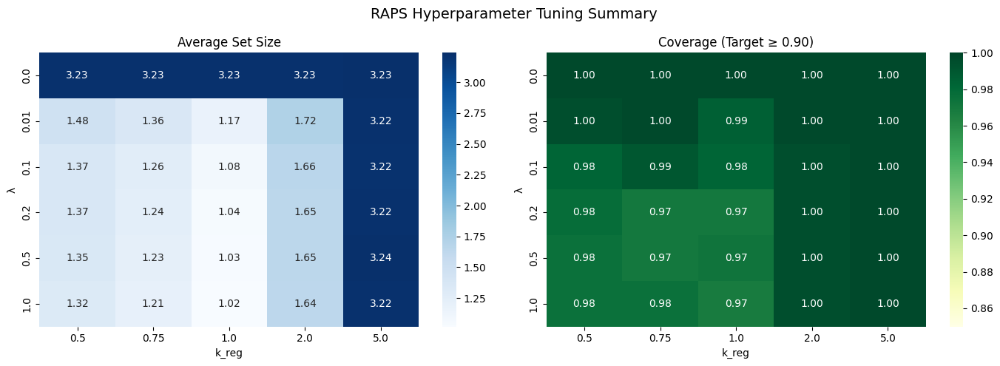

In [118]:
best_config, all_results = tune_raps_saps(probs_cal_single, y_cal_single, probs_test_single, y_test_single, alpha=0.1, method="RAPS")
plot_raps_saps_summary(all_results, alpha=0.1)

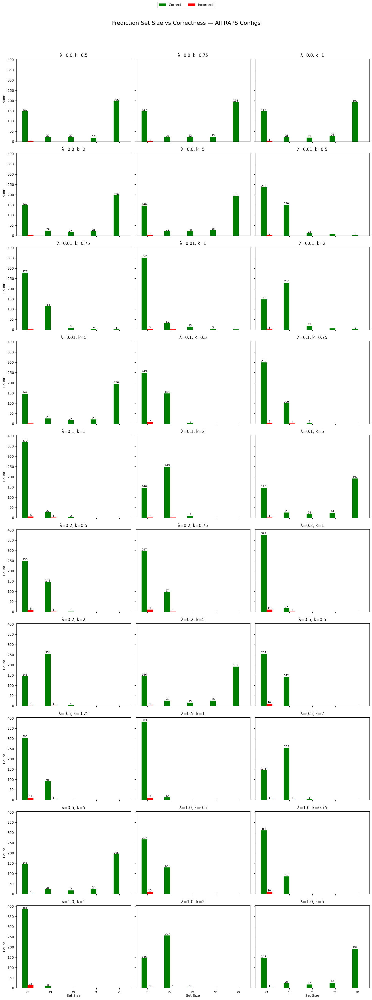

In [119]:
plot_all_correct_vs_incorrect(all_results, y_test_single)

**Apply best hyperparameters**

In [48]:
print(f"\nMeilleure configuration : {best_config}")


Meilleure configuration : {'method': 'RAPS', 'lambda': 1.0, 'kreg': 1, 'coverage': 0.9630541871921182, 'avg_size': 1.0098522167487685, 'tau_hat': 1.0, 'prediction_sets': [[2], [1], [0], [1], [1], [0], [2], [1], [2], [4], [1], [4], [3], [4], [4], [3], [2], [2], [2], [2], [1], [4], [1], [1], [0], [1], [1], [2], [1], [1], [1], [4], [1], [3], [3], [3], [4], [0], [1], [3], [3], [0], [0], [1], [1], [0], [4], [4], [2], [2], [2], [2], [1], [4], [0], [0], [0], [1], [3], [3], [4], [2], [1], [2], [3], [2], [1], [1], [4], [1], [4], [0], [1], [2], [3], [3], [4], [2], [1], [1], [4], [4], [4], [4, 3], [3], [4], [1], [3], [1], [2], [0], [4], [3], [1], [2], [3], [4], [1], [1], [4], [4], [0], [2], [2], [4], [2], [0], [2], [0], [4], [2], [0], [4], [1], [0], [2], [0], [2], [4], [0], [2], [3], [2], [4], [4], [1], [0, 1], [2], [2], [2], [3], [4], [3], [0], [1], [3], [0], [2], [2], [1], [4], [4], [1], [1], [0], [0], [2], [1], [4], [3], [3], [2], [1], [3], [2], [2], [2], [4], [1], [0], [2], [2], [4], [2], [2

In [122]:
alpha = 0.1
k_reg = 1

tau_hat = raps_calibration(
    probs_cal=probs_cal_single,
    y_cal=y_cal_single,
    lambda_reg=0.1,#best_config['lambda'],
    k_reg=0.75,#best_config['kreg'],
    alpha=alpha
)

prediction_sets_raps, sizes_raps = raps_predict_set(
    probs_test=probs_test_single,
    tau_hat=tau_hat,
    lambda_reg=0.1, #best_config['lambda'],
    k_reg=0.75 #best_config['kreg'],
)


Seuil τ̂_cal = 1.025

Test 0:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [2]
  Set size = 1

Test 1:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 2:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0]
  Set size = 1

Test 3:
  Sorted probs = [0.986 0.008 0.006 0.    0.   ]
  Prediction set (idx) = [1, 0]
  Set size = 2

Test 4:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 5:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0]
  Set size = 1

Test 6:
  Sorted probs = [0.999 0.001 0.    0.    0.   ]
  Prediction set (idx) = [2]
  Set size = 1

Test 7:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 8:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [2]
  Set size = 1

Test 9:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [4]
  Set size = 1

Test 10:
  Sorted probs = [0.545 0.433 0.011 0.009 0.003]
  Prediction set 

In [123]:
correct_raps = [y in pred for y, pred in zip(y_test_single, prediction_sets_raps)]
# plot_prediction_set_analysis(correct_raps, sizes_raps, method_name="RAPS")


**Find best hyperparameters**

Method=SAPS, λ=0.00, kreg=2, coverage=0.909, avg size=1.15
Method=SAPS, λ=0.01, kreg=2, coverage=0.929, avg size=1.18
Method=SAPS, λ=0.10, kreg=2, coverage=0.906, avg size=1.05
Method=SAPS, λ=0.20, kreg=2, coverage=0.897, avg size=0.98
Method=SAPS, λ=0.50, kreg=2, coverage=0.924, avg size=0.99
Method=SAPS, λ=1.00, kreg=2, coverage=0.936, avg size=0.99


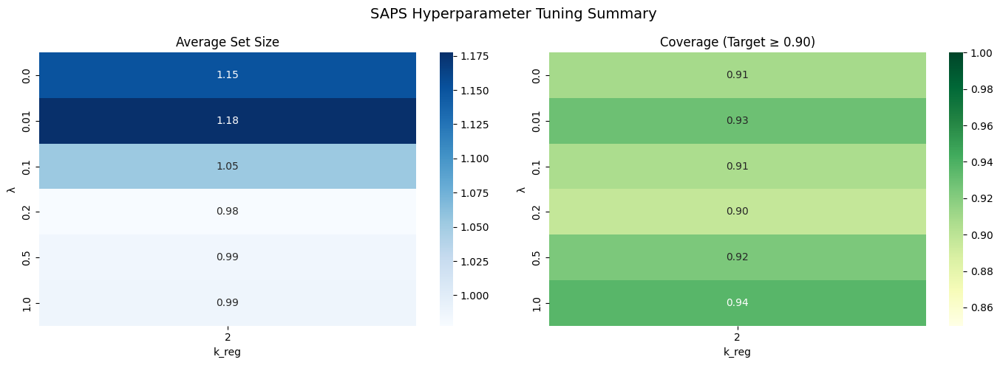

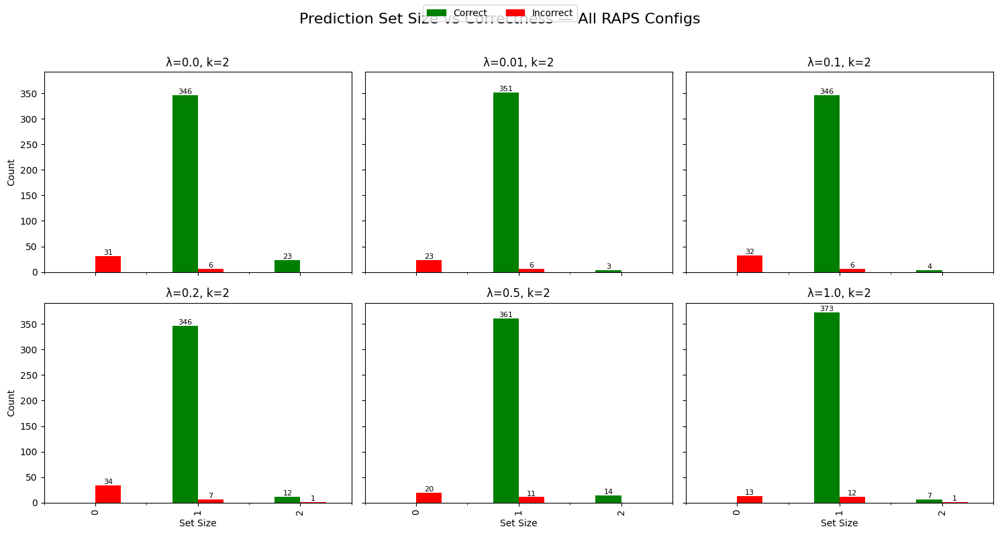


Meilleure configuration SAPS : {'method': 'SAPS', 'lambda': 0.5, 'kreg': 2, 'coverage': 0.9236453201970444, 'avg_size': 0.9852216748768473, 'tau_hat': 0.9232493042945862, 'prediction_sets': [[2], [1], [0], [1], [1], [0], [2], [1], [2], [4], [1, 2], [4], [3], [], [4], [3], [2], [2], [2], [2], [1], [4], [1], [1], [0], [1], [1], [2], [1], [1], [1], [4], [], [3], [3], [3], [], [0], [1], [3], [], [], [0], [1], [1], [0], [4], [4], [2], [2], [2], [2], [1], [4], [0], [0], [0], [1], [3], [3], [4], [], [1], [2], [3], [2], [1], [1], [4], [1], [4], [0], [1], [2], [], [], [4], [2], [1], [1], [4], [4], [4], [3, 4], [3], [4], [1], [3], [1], [2], [0], [4], [3], [1], [2], [3], [4], [1], [1], [4], [4], [0], [2], [1, 2], [4], [2], [0], [2], [0], [4], [2], [0], [4], [], [0], [2], [0], [2], [4], [0], [2], [3], [2], [], [4], [1], [0, 1], [2], [2], [2], [3], [4], [3], [0], [1], [3], [0], [2], [2], [1], [4], [4], [1], [1], [0], [0], [2], [1], [4], [3], [3], [2], [], [], [2], [2], [2], [4], [1], [0], [2, 4], 

In [127]:
best_config_saps, all_results_saps = tune_raps_saps(probs_cal_single, y_cal_single, probs_test_single, y_test_single, alpha=0.1, method="SAPS")
plot_raps_saps_summary(all_results_saps, alpha=0.1)
plot_all_correct_vs_incorrect(all_results_saps, y_test_single)
print(f"\nMeilleure configuration SAPS : {best_config_saps}")


In [128]:
tau_hat_saps = saps_calibration(
    probs_cal=probs_cal_single,
    y_cal=y_cal_single,
    lambda_reg=0.5,#best_config_saps['lambda'],
    randomized=True,
    alpha=alpha
)
prediction_sets_saps, correct_saps, sizes_saps, q_hat_saps = apply_saps(
    probs_cal=probs_cal_single,
    y_cal=y_cal_single,
    probs_test=probs_test_single,
    y_test=y_test_single,
    alpha=0.1,
    lambda_reg= 0.5,#best_config_saps['lambda'],
    randomized=True,
    verbose=True
)
# unique = set()
print(f" {set(sizes_saps)}")


Threshold q̂ = 0.9362

Sample 0
  Prediction set = [2]
  Set size = 1, True label = 2, Correct = True

Sample 1
  Prediction set = [1]
  Set size = 1, True label = 1, Correct = True

Sample 2
  Prediction set = [0]
  Set size = 1, True label = 0, Correct = True

Sample 3
  Prediction set = [1]
  Set size = 1, True label = 1, Correct = True

Sample 4
  Prediction set = [1]
  Set size = 1, True label = 1, Correct = True
 {0, 1, 2}


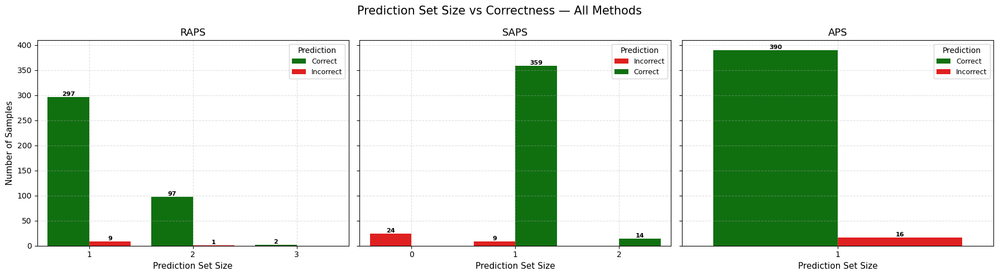

In [130]:
correct_raps = [y in pred for y, pred in zip(y_test_single, prediction_sets_raps)]
# plot_prediction_set_analysis(correct_raps, sizes_raps, method_name="RAPS")

# plot_prediction_set_analysis(correct_saps, sizes_saps, method_name="SAPS")

# plot_prediction_set_analysis(correct_single_aps, sizes_single_aps, method_name="APS")


plot_prediction_set_analysis_all(
    correct_raps, sizes_raps,
    correct_saps, sizes_saps,
    correct_single_aps, sizes_single_aps
)


In [58]:
#=======================
# 📌 MC Dropout        =
#=======================

finetuned_model_mcd = FineTunedResNet50(num_classes=5, mc_dropout=True).to(device)
finetuned_model_mcd.load_state_dict(torch.load(PROJECT_PATH + "/outputs/models/SipakmedFineTunedResNet50_MCD.pth", map_location=device))
probs_cal_mcd, y_cal_mcd = get_probs_and_labels(
    model=finetuned_model_mcd,
    dataloader=cal_loader,
    device=device,
    mc_dropout=True
)
probs_test_mcd, y_test_mcd = get_probs_and_labels(
    model=finetuned_model_mcd,
    dataloader=test_loader,
    device=device,
    mc_dropout=True
)

/tmp/ipykernel_28079/1212599343.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  finetuned_model_mcd.load_state_dict(torch.load(PROJECT_PATH + "/outputs/models/SipakmedFi

Seuil τ̂_cal = 1.000

Test 0:
  Sorted probs = [0.982 0.018 0.    0.    0.   ]
  Prediction set (idx) = [2, 3, 0, 1, 4]
  Set size = 5

Test 1:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1, 2, 0]
  Set size = 3

Test 2:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0]
  Set size = 1

Test 3:
  Sorted probs = [0.471 0.424 0.068 0.034 0.002]
  Prediction set (idx) = [3, 2, 0, 1, 4]
  Set size = 5

Test 4:
  Sorted probs = [0.786 0.158 0.035 0.017 0.004]
  Prediction set (idx) = [1, 0, 2, 3, 4]
  Set size = 5

Test 5:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0, 3]
  Set size = 2

Test 6:
  Sorted probs = [0.996 0.004 0.001 0.    0.   ]
  Prediction set (idx) = [2, 1, 0, 3, 4]
  Set size = 5

Test 7:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1, 2, 0, 3]
  Set size = 4

Test 8:
  Sorted probs = [0.992 0.007 0.001 0.001 0.   ]
  Prediction set (idx) = [2, 4, 3, 1, 0]
  Set size = 5

Test 9:
  Sorted probs = [1. 0. 0. 0. 0.]


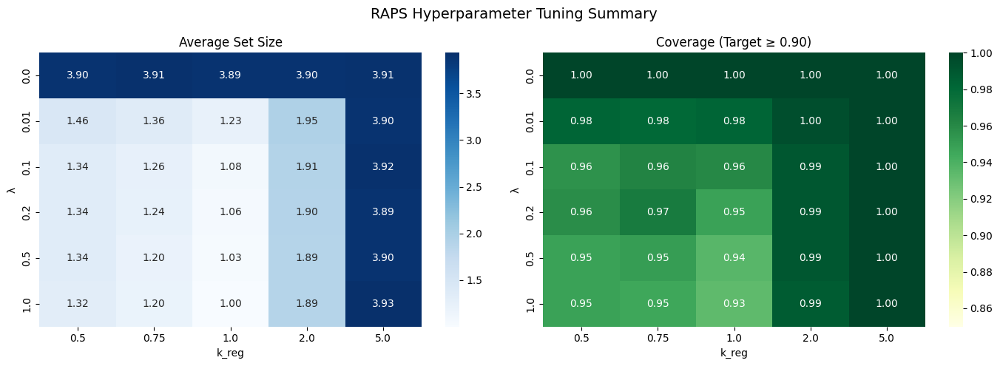

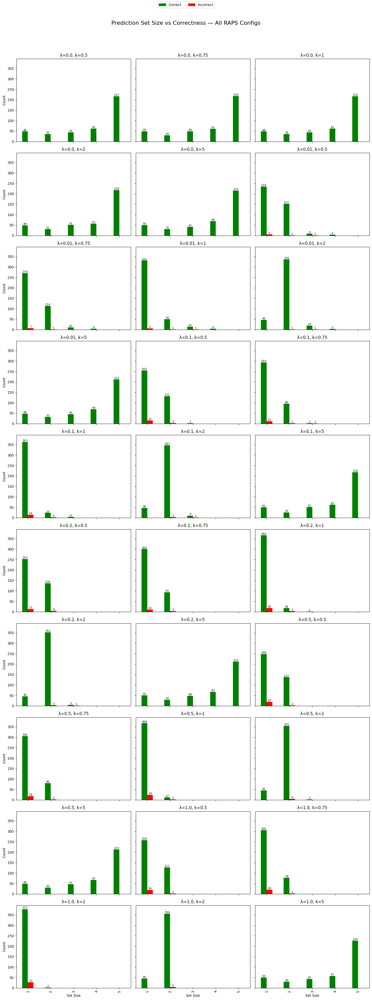


Meilleure configuration MCD : {'method': 'RAPS', 'lambda': 1.0, 'kreg': 1, 'coverage': 0.9334975369458128, 'avg_size': 1.0049261083743843, 'tau_hat': 0.9999998807907104, 'prediction_sets': [[2], [1], [0], [3], [1], [0], [2], [1], [2], [4], [2], [4], [3], [4], [4], [3], [2], [2], [2], [2], [1], [4], [1], [1], [0], [1], [3], [2], [0], [0], [1], [4], [1], [3], [3], [3], [4], [0], [1], [3], [3], [0], [0], [1], [2], [0], [4], [4], [2], [2], [2], [2], [1], [4], [0], [0], [0], [1], [3], [3], [4], [2], [1], [2], [3], [2], [1], [2], [4], [1], [4], [0], [1], [2], [3], [3], [4], [2], [1], [1], [4], [4], [4], [3], [3], [4], [1], [3], [1], [2], [0], [4], [3], [1], [2], [3], [3], [1], [1], [4], [4], [0], [2], [1], [4], [2], [0], [1], [0], [4], [3], [0], [4], [1], [0], [2], [0], [2], [4], [0], [2], [3], [2], [4], [4], [1], [1], [2], [2], [2], [3], [4], [3], [0], [1], [3], [0], [2], [2], [1], [4], [4], [1], [1], [0], [0], [1], [1], [4], [3], [3], [2], [1], [3], [2], [2], [2], [4], [1], [0], [2], [2],

In [61]:
prediction_sets_mcd_aps, correct_mcd_aps, sizes_mcd_aps, q_hat_mcd_aps = apply_aps(
    probs_cal=probs_cal_mcd,
    y_cal=y_cal_mcd,
    probs_test=probs_test_mcd,
    y_test=y_test_mcd,
    alpha=0.1,
    verbose=True,
    empty_set=False
)

# plot_prediction_set_analysis(correct_mcd_aps, sizes_mcd_aps, method_name="MCD APS")
best_config_mcd, all_results_mcd = tune_raps_saps(probs_cal_mcd, y_cal_mcd, probs_test_mcd, y_test_mcd, alpha=0.1, method="RAPS")
plot_raps_saps_summary(all_results_mcd, alpha=0.1)
plot_all_correct_vs_incorrect(all_results_mcd, y_test_mcd)
print(f"\nMeilleure configuration MCD : {best_config_mcd}")
tau_hat_mcd = raps_calibration(
    probs_cal=probs_cal_mcd,
    y_cal=y_cal_mcd,
    lambda_reg=best_config_mcd['lambda'],
    k_reg=best_config_mcd['kreg'],
    alpha=0.1
)


Test 0:
  Sorted probs = [0.982 0.018 0.    0.    0.   ]
  Prediction set (idx) = [2]
  Set size = 1

Test 1:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 2:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0]
  Set size = 1

Test 3:
  Sorted probs = [0.471 0.424 0.068 0.034 0.002]
  Prediction set (idx) = [3, 2]
  Set size = 2

Test 4:
  Sorted probs = [0.786 0.158 0.035 0.017 0.004]
  Prediction set (idx) = [1, 0]
  Set size = 2

Test 5:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [0]
  Set size = 1

Test 6:
  Sorted probs = [0.996 0.004 0.001 0.    0.   ]
  Prediction set (idx) = [2]
  Set size = 1

Test 7:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [1]
  Set size = 1

Test 8:
  Sorted probs = [0.992 0.007 0.001 0.001 0.   ]
  Prediction set (idx) = [2]
  Set size = 1

Test 9:
  Sorted probs = [1. 0. 0. 0. 0.]
  Prediction set (idx) = [4]
  Set size = 1

Test 10:
  Sorted probs = [0.817 0.072 0.062 0.0

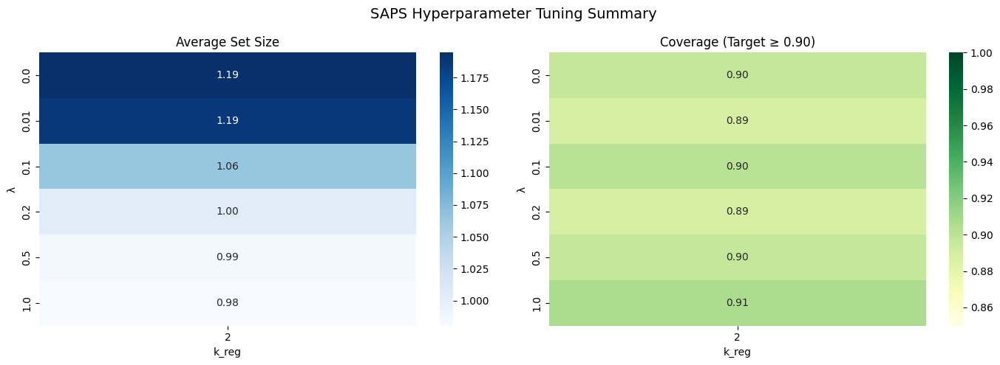

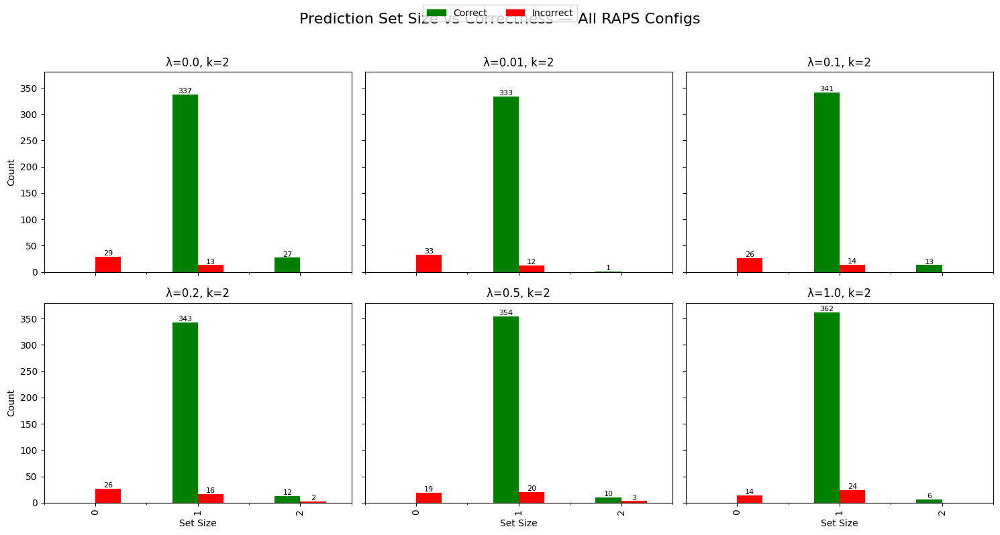

In [131]:

prediction_sets_mcd_raps, sizes_mcd_raps = raps_predict_set(
    probs_test=probs_test_mcd,
    tau_hat=tau_hat_mcd,
    lambda_reg= 0.1, #best_config_mcd['lambda'],
    k_reg= 1#best_config_mcd['kreg'],
)
correct_mcd_raps = [y in pred for y, pred in zip(y_test_mcd, prediction_sets_mcd_raps)]
# plot_prediction_set_analysis(correct_mcd_raps, sizes_mcd_raps, method_name="MCD RAPS")
best_config_mcd_saps, all_results_mcd_saps = tune_raps_saps(probs_cal_mcd, y_cal_mcd, probs_test_mcd, y_test_mcd, alpha=0.1, method="SAPS")
plot_raps_saps_summary(all_results_mcd_saps, alpha=0.1)
plot_all_correct_vs_incorrect(all_results_mcd_saps, y_test_mcd)



Meilleure configuration MCD SAPS : {'method': 'SAPS', 'lambda': 1.0, 'kreg': 2, 'coverage': 0.9064039408866995, 'avg_size': 0.9802955665024631, 'tau_hat': 0.9559800624847412, 'prediction_sets': [[2], [1], [0], [3], [1], [0], [2], [1], [2], [4], [1, 2], [4], [3], [4], [4], [3], [2], [2], [2], [2], [1], [4], [1], [1], [0], [1], [3], [2], [0], [0], [1], [4], [1], [], [3], [3], [4], [0], [1], [3], [3], [0], [0], [1], [2], [0], [4], [4], [2], [2], [2], [2], [1], [4], [0], [0], [0], [1], [3], [3], [4], [2], [1], [2], [3], [2], [1], [2], [4], [1], [4], [0], [1], [2], [3], [3], [], [2], [1], [1], [], [4], [4], [3], [3], [4], [1], [3], [1], [2], [0], [4], [3], [1], [2], [3], [3], [1], [1], [4], [4], [0], [2], [1], [4], [2], [0], [1], [0], [4], [3], [0], [4], [1], [0], [2], [0], [2], [4], [0], [2], [3], [2], [4], [4], [1], [1], [2], [2], [], [3], [4], [3], [0], [1], [3], [0], [2], [2], [1], [4], [4], [1], [1], [0], [0], [1], [1], [4], [3], [3], [2], [1], [3], [2], [2], [2], [4], [], [0], [2], [

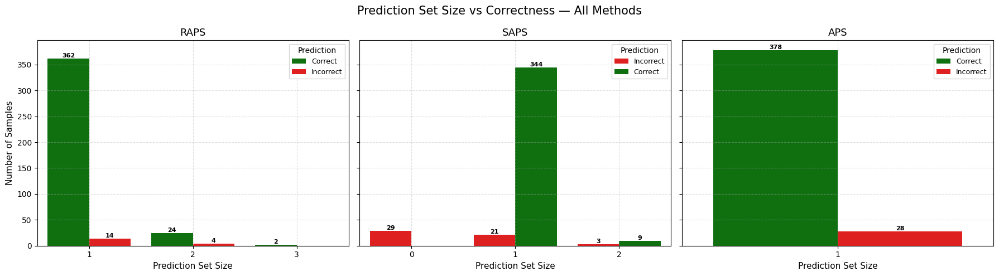

In [133]:
print(f"\nMeilleure configuration MCD SAPS : {best_config_mcd_saps}")
tau_hat_mcd_saps = saps_calibration(
    probs_cal=probs_cal_mcd,
    y_cal=y_cal_mcd,
    lambda_reg=0.5,#best_config_mcd_saps['lambda'],
    randomized=True,
    alpha=0.1
)
prediction_sets_mcd_saps, correct_mcd_saps, sizes_mcd_saps, q_hat_mcd_saps = apply_saps(
    probs_cal=probs_cal_mcd,
    y_cal=y_cal_mcd,
    probs_test=probs_test_mcd,
    y_test=y_test_mcd,
    alpha=0.1,
    lambda_reg=0.5,#best_config_mcd_saps['lambda'],
    randomized=True,
    verbose=True
)
plot_prediction_set_analysis_all(
    correct_mcd_raps, sizes_mcd_raps,
    correct_mcd_saps, sizes_mcd_saps,
    correct_mcd_aps, sizes_mcd_aps
)


**4.0 Entropy**, **KS Test + Cohen's d**, **Rejection Curve**

In [134]:
def entropy(probs):
	"""
	Calculate the entropy of a probability distribution.
	Supports both NumPy arrays and PyTorch tensors.
	"""
	if isinstance(probs, torch.Tensor):
		probs = probs.clamp(min=1e-12) 
		return -(probs * probs.log()).sum(dim=-1).item()
	elif isinstance(probs, np.ndarray):
		probs = np.clip(probs, 1e-12, 1.0) 
		return -np.sum(probs * np.log(probs), axis=-1)
	else:
		raise TypeError("Input must be a NumPy array or PyTorch tensor.")


def split_entropy_by_correctness(probs, y_true):
    """
    Split entropy values based on prediction correctness.

    Returns:
        entropy_correct: list of entropy values where prediction was correct
        entropy_wrong: list where it was incorrect
    """
    entropies = entropy(probs)
    preds = np.argmax(probs, axis=1)
    correct = preds == y_true
    return entropies[correct], entropies[~correct], entropies


from scipy.stats import ks_2samp

def compare_uncertainty_distributions(entropy_correct, entropy_wrong):
    """
    Compare entropy distributions with Cohen's d and KS test.
    """
    # Cohen's d
    m1, m2 = np.mean(entropy_correct), np.mean(entropy_wrong)
    s1, s2 = np.std(entropy_correct), np.std(entropy_wrong)
    pooled_std = np.sqrt((s1**2 + s2**2) / 2)
    cohens_d = (m2 - m1) / pooled_std

    # KS test
    ks_stat, ks_p = ks_2samp(entropy_correct, entropy_wrong)

    print(f"Cohen's d = {cohens_d:.3f} (effect size)")
    print(f"KS test statistic = {ks_stat:.3f}, p-value = {ks_p:.3g}")


Q1 (25th percentile): 1.1852269743428678e-07
Q2 (Median, 50th percentile): 1.9487216377456207e-05
Q3 (75th percentile): 0.0013826429203618318


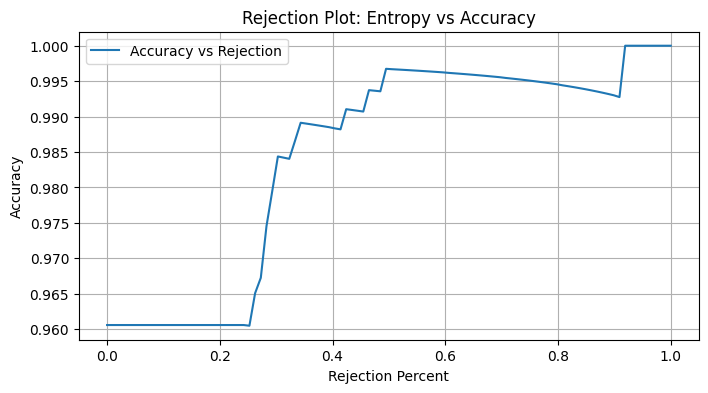

In [135]:
entropies = []
for prob in probs_test_single:
    ent = entropy(prob)
    entropies.append(ent)
    
entropies = np.array(entropies)
sorted_entropies_idx = np.argsort(entropies)    
sorted_entropies = entropies[sorted_entropies_idx]
y_pred = [np.argmax(probs) for probs in probs_test_single]  

# Calculate the quantiles q1, q2, q3 of the entropies
q1 = np.percentile(entropies, 25)
q2 = np.percentile(entropies, 50)
q3 = np.percentile(entropies, 75)

print(f"Q1 (25th percentile): {q1}")
print(f"Q2 (Median, 50th percentile): {q2}")
print(f"Q3 (75th percentile): {q3}")

def analyze_entropy_vs_accuracy(entropies, y_pred, y_test, q1, num_points=100):
    """
    Analyze the relationship between entropy and accuracy by rejecting samples with high entropy.

    Parameters:
    - entropies: numpy array of entropy values.
    - y_pred: list of predicted labels.
    - y_test: numpy array of true labels.
    - q1: float, the 25th percentile of entropy values.
    - num_points: int, number of points to evaluate for rejection percentages.

    Returns:
    - results: dict containing accuracy and rejection percentages.
    """
    results = {
        'acc': [],
        'rejection_percent': []
    }
    seuil_reject = q1
    sorted_entropies_idx = np.argsort(entropies)
    sorted_entropies = entropies[sorted_entropies_idx]

    for percent in np.linspace(0, 1, num_points):
        filter_sorted_entropies = sorted_entropies[sorted_entropies <= seuil_reject]
        nb_items_to_complete = int(len(sorted_entropies > seuil_reject) * (1 - percent))
        nb_items_needs = len(filter_sorted_entropies) + nb_items_to_complete
        combined_indices = sorted_entropies_idx[:nb_items_needs]

        sorted_y_pred = np.array(y_pred)[combined_indices]
        sorted_y_test = np.array(y_test)[combined_indices]
        accuracy = np.sum(sorted_y_test == sorted_y_pred) / len(sorted_y_test)

        results['acc'].append(accuracy)
        results['rejection_percent'].append(percent)

    return results


results = analyze_entropy_vs_accuracy(entropies, y_pred, y_test_single, q1)

plt.figure(figsize=(8, 4))
plt.plot(results['rejection_percent'], results['acc'], label="Accuracy vs Rejection")
plt.xlabel('Rejection Percent')
plt.ylabel('Accuracy')
plt.title("Rejection Plot: Entropy vs Accuracy")
plt.legend()
plt.grid(True)
plt.show()

/tmp/ipykernel_28079/1025516109.py:48: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = spearmanr(entropies, set_sizes)


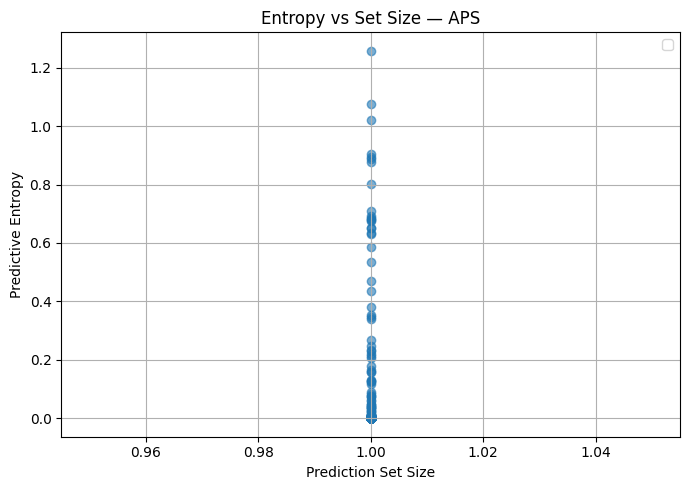

🔍 Spearman correlation = nan (p = nan)
📊 Kruskal-Wallis test statistic = nan (p = nan)


TypeError: only integer scalar arrays can be converted to a scalar index

In [ ]:
from scipy.stats import spearmanr, kruskal


def scatter_entropy_vs_setsize_all(
    entropies_dict,
    set_sizes_dict,
    method_names=("APS", "RAPS", "SAPS")
):
    """
    Plot scatter entropy vs set size for multiple methods side by side.

    Args:
        entropies_dict (dict): method name -> entropies (list or np.array)
        set_sizes_dict (dict): method name -> set sizes (list or np.array)
        method_names (tuple): names of the methods to plot (order matters)
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

    for ax, method in zip(axes, method_names):
        entropies = np.array(entropies_dict[method])
        set_sizes = np.array(set_sizes_dict[method])

        # Compute stats
        spearman_corr, spearman_p = spearmanr(entropies, set_sizes)

        bins = np.percentile(entropies, [0, 25, 50, 75, 100])
        groups = []
        for i in range(4):
            mask = (entropies >= bins[i]) & (entropies <= bins[i+1])
            groups.append(set_sizes[mask.nonzero()[0]])
        kruskal_stat, kruskal_p = kruskal(*groups)

        # Plot
        ax.scatter(set_sizes, entropies, alpha=0.6, label=method)
        ax.set_xlabel("Prediction Set Size")
        ax.set_title(f"{method}\nSpearman r={spearman_corr:.2f}, p={spearman_p:.3g}\nKruskal p={kruskal_p:.3g}")
        ax.grid(True)

    axes[0].set_ylabel("Predictive Entropy")
    fig.suptitle("Entropy vs Prediction Set Size — All Methods", fontsize=16)
    plt.tight_layout()
    plt.show()

def scatter_entropy_vs_setsize(entropies, set_sizes, method_name="Model"):
    """
    Scatter plot of entropy vs set size + Spearman correlation and Kruskal-Wallis test.
    """
    spearman_corr, spearman_p = spearmanr(entropies, set_sizes)

    bins = np.percentile(entropies, [0, 25, 50, 75, 100])
    groups = []
    for i in range(4):
        mask = (entropies >= bins[i]) & (entropies <= bins[i+1])
        groups.append(set_sizes[mask])

    valid_groups = [g for g in groups if len(np.unique(g)) > 1]

    if len(valid_groups) >= 2:
        kruskal_stat, kruskal_p = kruskal(*valid_groups)
    else:
        kruskal_stat, kruskal_p = np.nan, np.nan
    # Plot
    plt.figure(figsize=(7, 5))
    plt.scatter(set_sizes, entropies, alpha=0.6)
    plt.xlabel("Prediction Set Size")
    plt.ylabel("Predictive Entropy")
    plt.legend()
    plt.title(f"Entropy vs Set Size — {method_name}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Print stats
    print(f"🔍 Spearman correlation = {spearman_corr:.3f} (p = {spearman_p:.3g})")
    print(f"📊 Kruskal-Wallis test statistic = {kruskal_stat:.3f} (p = {kruskal_p:.3g})")


sizes_single_aps = np.array(sizes_single_aps)
scatter_entropy_vs_setsize(entropies, sizes_single_aps, method_name="APS")
scatter_entropy_vs_setsize(entropies, sizes_raps, method_name="RAPS")
scatter_entropy_vs_setsize(entropies, sizes_saps, method_name="SAPS")


In [ ]:

# entropies_mcd_aps = entropy(
#     probs=probs_test_mcd
# )
# entropies_mcd_raps = entropy(
#     probs=probs_test_mcd
# )
# entropies_mcd_saps = entropy(
#     probs=probs_test_mcd
# )
# sizes_aps = np.array(sizes_single_aps)
# sizes_raps = np.array(sizes_mcd_raps)
# sizes_saps = np.array(sizes_mcd_saps)

# scatter_entropy_vs_setsize_all(
#     entropies_dict={
#         "APS": entropies_mcd_aps,
#         "RAPS": entropies_mcd_raps,
#         "SAPS": entropies_mcd_saps
#     },
#     set_sizes_dict={
#         "APS": sizes_aps,
#         "RAPS": sizes_raps,
#         "SAPS": sizes_saps
#     }
# )


/tmp/ipykernel_28079/3816640801.py:48: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_corr, spearman_p = spearmanr(entropies, set_sizes)


TypeError: only integer scalar arrays can be converted to a scalar index

In [71]:

import requests

def download_and_save_image(url, save_path):
    response = requests.get(url)
    if response.status_code == 200:
        with open(save_path, 'wb') as file:
            file.write(response.content)
    else:
        print(f"Failed to download image from {url}. Status code: {response.status_code}")
def create_ood_dataset(image_urls, save_dir):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    

    for i, url in enumerate(image_urls):
        image_name = (url.split("/")[-1]).split("-")[0] + ".jpg"
        save_path = os.path.join(save_dir, image_name)
        download_and_save_image(url, save_path)
        print(f"Downloaded and saved {image_name}")

image_urls = [
    "https://cdn.pixabay.com/photo/2024/02/24/17/37/lemons-8594421_1280.jpg",
    "https://cdn.pixabay.com/photo/2022/04/05/17/06/butterfly-7114037_640.jpg",
    "https://cdn.pixabay.com/photo/2025/03/21/21/22/roche-9485693_640.jpg"
]
ood_dataset_dir = "ood_dataset"
create_ood_dataset(image_urls, ood_dataset_dir)




Downloaded and saved lemons.jpg
Downloaded and saved butterfly.jpg
Downloaded and saved roche.jpg


In [74]:
from torchvision import transforms
from PIL import Image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


imgs = []
for filename in os.listdir(ood_dataset_dir):
    image_path = os.path.join(ood_dataset_dir, filename)
    img  = Image.open(image_path)
    img = transform(img)
    imgs.append(img)
imgs = torch.stack(imgs)

finetuned_model_single.eval()
with torch.no_grad():
    logits = finetuned_model_single(imgs)
    print(f" Logits OOD: {logits}")
    probs_ood = torch.nn.Softmax(dim=1)(logits)
    print(f" Probs OOD: {probs_ood}")
    preds_ood = torch.argmax(probs_ood, dim=1)
    print(f"Predictions OOD: {preds_ood}")

# prediction with test set
finetuned_model_single.eval()
with torch.no_grad():
    for batch in iter(test_loader):
        X_batch, y_batch = batch
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        logits = finetuned_model_single(X_batch)
        print(f"Logits: {logits[:3]}")
        probs_id = torch.nn.Softmax(dim=1)(logits)
        print(f"Probs: {probs_id[:3]}")
        preds_id = torch.argmax(probs_id, dim=1)
        print(f"Predictions: {preds_id[:3]}")
        break
    

 Logits OOD: tensor([[-1.3320,  5.0760,  2.8865, -4.3293, -1.5868],
        [-2.0495,  3.8193, -0.2336, -2.7688,  3.4041],
        [-2.6032, 10.3932,  2.4491, -7.1587,  0.1782]])
 Probs OOD: tensor([[1.4783e-03, 8.9688e-01, 1.0043e-01, 7.3800e-05, 1.1458e-03],
        [1.6805e-03, 5.9460e-01, 1.0330e-02, 8.1850e-04, 3.9257e-01],
        [2.2676e-06, 9.9961e-01, 3.5461e-04, 2.3831e-08, 3.6601e-05]])
Predictions OOD: tensor([1, 1, 1])
Logits: tensor([[ -4.8932,   0.2962,   9.2427,  -1.3638,  -3.8080],
        [ -0.1805,  19.5195,   0.6631, -10.1063,  -3.7838],
        [ 19.2002,   2.8348,  -6.7791,  -4.9187,  -9.8084]])
Probs: tensor([[7.2574e-07, 1.3016e-04, 9.9984e-01, 2.4749e-05, 2.1482e-06],
        [2.7823e-09, 1.0000e+00, 6.4683e-09, 1.3605e-13, 7.5773e-11],
        [1.0000e+00, 7.8087e-08, 5.2159e-12, 3.3519e-11, 2.5219e-13]])
Predictions: tensor([2, 1, 0])


In [75]:


entropie_ood = [entropy(prob) for prob in probs_ood]
entropie_id = [entropy(prob) for prob in probs_id]
print(f"Entropie OOD: {entropie_ood}")
print(f"Entropie ID: {entropie_id}")

Entropie OOD: [0.3465219736099243, 0.7399693131446838, 0.003614351386204362]
Entropie ID: [0.0016231664922088385, 1.785730603387492e-07, 1.3981090205561486e-06, 0.08432023227214813, 5.645095370709896e-05, 1.4360139175551012e-05, 0.00936898123472929, 8.631571972728125e-07, 0.0023949099704623222, 6.711750756949186e-06, 0.8013367652893066, 3.202297739335336e-05, 2.550228694886414e-09, 2.142428314755307e-07, 2.4434640977233357e-07, 0.0004217346431687474, 0.00946662575006485, 4.431813795235939e-05, 6.811797356931493e-05, 0.000613933487329632, 1.7540287278183797e-10, 3.57036014975165e-06, 3.1537419342697603e-09, 5.558774418545909e-08, 0.009062504395842552, 2.5471408093835635e-07, 0.3542270362377167, 9.094322012970224e-05, 0.16446653008460999, 0.38007986545562744, 1.1052408294132121e-10, 6.0828737602491856e-09]


ROC AUC: 0.875
Average Precision: 0.391


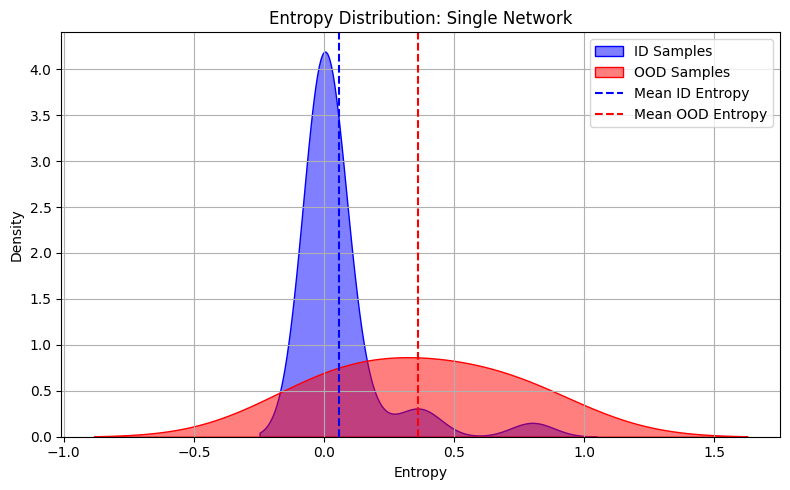

In [76]:
from sklearn.metrics import roc_auc_score, average_precision_score


y_true = [0] * len(entropie_id) + [1] * len(entropie_ood)
y_scores = entropie_id + entropie_ood
roc_auc = roc_auc_score(y_true, y_scores)
average_precision = average_precision_score(y_true, y_scores)
print(f"ROC AUC: {roc_auc:.3f}")
print(f"Average Precision: {average_precision:.3f}")


def plot_ood_distribution(entropies_id, entropies_ood, method_name="Model"):
    """
    Plot the distribution of entropies for ID and OOD samples.
    """
    plt.figure(figsize=(8, 5))
    sns.kdeplot(entropies_id, label='ID Samples', color='blue', fill=True, alpha=0.5)
    sns.kdeplot(entropies_ood, label='OOD Samples', color='red', fill=True, alpha=0.5)
    plt.axvline(np.mean(entropies_id), color='blue', linestyle='--', label='Mean ID Entropy')
    plt.axvline(np.mean(entropies_ood), color='red', linestyle='--', label='Mean OOD Entropy')
    plt.title(f"Entropy Distribution: {method_name}")
    plt.xlabel("Entropy")
    plt.ylabel("Density")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
plot_ood_distribution(entropie_id, entropie_ood, method_name="Single Network")

Predicted class: 0


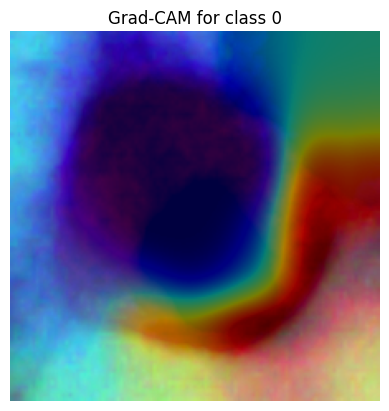

In [ ]:
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
from torchcam.methods import SmoothGradCAMpp, GradCAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image

# Load and preprocess the image
img_path = "/home/conite/Documents/STAGE/HybridUncertaintyAwareDL/outputs/sipakmed_combine/0__001_04.bmp"

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

img_pil = Image.open(img_path).convert("RGB")
img_tensor = transform(img_pil).unsqueeze(0).to(device)
img_tensor.requires_grad = True

finetuned_model_single.eval()

cam_extractor = SmoothGradCAMpp(
    model=finetuned_model_single,
    target_layer=finetuned_model_single.model.layer4[2].conv3
)

with torch.enable_grad():
    out = finetuned_model_single(img_tensor)
    pred_class = out.argmax(dim=1).item()
    print(f"Predicted class: {pred_class}")
    
activation_map = cam_extractor(pred_class, out)
result = overlay_mask(
    to_pil_image(img_tensor.squeeze(0).cpu().clamp(0, 1)),
    to_pil_image(activation_map[0].squeeze(0), mode='F'),
    alpha=0.5
)

plt.imshow(result)
plt.axis("off")
plt.title(f"Grad-CAM for class {pred_class}")
plt.show()

In [ ]:
import numpy as np

class ConformalPredictor:
    def __init__(self, method='raps', lambda_param=1.0, k_reg=1, randomize=True):
        """
        Paramètres :
          - method : 'raps' ou 'saps'
          - lambda_param : hyperparamètre de régularisation (λ)
          - k_reg : paramètre de seuil pour la régularisation (k₍reg₎)
          - randomize : si True, on utilise la randomisation (u ~ U(0,1))
        """
        self.method = method.lower()
        self.lambda_param = lambda_param
        self.k_reg = k_reg
        self.randomize = randomize
        self.tau = None
        
        
    def _compute_aps_score(self, probs, true_label):
        """
        Calcule le score APS pour un échantillon de calibration.
        Selon la formule :
          score = π̂(x)[y] + λ·max(r - k_reg, 0)
        où π̂(x)[y] est la probabilité prédite pour la vraie classe y,
        et r est le rang (1-indexé) de y dans l'ordre décroissant.
        """
        sorted_indices = np.argsort(probs)[::-1]
        rank = np.where(sorted_indices == true_label)[0][0] + 1
        score = probs[true_label] + self.lambda_param * max(rank - self.k_reg, 0)
        return score
    
    def _compute_raps_score(self, probs, true_label, u):
        """
        Calcule le score RAPS pour un échantillon de calibration.
        Selon la formule :
          score = ρ(x,y) + π̂(x)[y]·u + λ·max(r - k_reg, 0)
        où ρ(x,y) est la somme cumulée des probabilités des classes mieux classées que y,
        et r est le rang (1-indexé) de y dans l'ordre décroissant.
        """
        # Trier les indices par ordre décroissant
        sorted_indices = np.argsort(probs)[::-1]
        sorted_probs = probs[sorted_indices]
        # Trouver le rang de la classe vraie (1-indexé)
        rank = np.where(sorted_indices == true_label)[0][0] + 1
        rho = 0.0 if rank == 1 else np.sum(sorted_probs[:rank-1])
        score = rho + probs[true_label] * u + self.lambda_param * max(rank - self.k_reg, 0)
        return score

    def _compute_saps_score(self, probs, true_label, u):
        """
        Calcule le score SAPS pour un échantillon de calibration.
        Pour la classe ayant le rang 1, score = u * MSP.
        Sinon, score = MSP + (r - 2 + u)*λ,
        où MSP est la valeur maximale de la softmax, et r est le rang de la vraie classe.
        """
        max_prob = np.max(probs)
        sorted_indices = np.argsort(probs)[::-1]
        rank = np.where(sorted_indices == true_label)[0][0] + 1
        if rank == 1:
            score = u * max_prob
        else:
            score = max_prob + (rank - 2 + u) * self.lambda_param
        return score

    def calibrate(self, cal_probs, cal_labels, alpha=0.1):
        """
        Calibre le seuil τ à partir d'un jeu de calibration.
          - cal_probs : liste (ou array) de vecteurs de probabilités (n_samples x K)
          - cal_labels : vecteur de labels vrais (n_samples)
          - alpha : niveau d'erreur souhaité
        Pour chaque échantillon de calibration, on calcule le score (selon RAPS ou SAPS).
        Le seuil τ est le quantile (ce qui correspond à la formule de la calibration par split conformal).
        """
        scores = []
        n = len(cal_labels)
        for i in range(n):
            u = np.random.uniform(0, 1) if self.randomize else 0.5
            if self.method == 'raps':
                score = self._compute_raps_score(cal_probs[i], cal_labels[i], u)
            elif self.method == 'saps':
                score = self._compute_saps_score(cal_probs[i], cal_labels[i], u)
            elif self.method == 'aps':
                score = self._compute_aps_score(cal_probs[i], cal_labels[i])
            else:
                raise ValueError("Méthode non supportée : " + self.method)
            scores.append(score)
        scores = np.array(scores)
        sorted_scores = np.sort(scores)
        # Trouver le rang quantile : le ceil((n+1)*(1-α))-ème score (en indice 0-indexé)
        k = int(np.ceil((n + 1) * (1 - alpha))) - 1
        self.tau = sorted_scores[min(k, n - 1)]
        return self.tau

    def predict(self, probs):
        """
        Génère l'ensemble de prédiction pour un échantillon de test dont le vecteur de probabilités est 'probs'.
        La procédure diffère selon la méthode :
        
        • Pour RAPS :
          - On trie les probabilités par ordre décroissant.
          - On cherche le plus petit entier L tel que la somme cumulée des probabilités des L premières classes
            plus λ·max(L - k_reg, 0) dépasse le seuil τ.
          - Une étape de randomisation ajuste éventuellement L.
          - L'ensemble de prédiction est alors constitué des L classes les mieux classées.
        
        • Pour SAPS :
          - On calcule pour chaque classe (en ordre décroissant) un score défini par :
              * Si la classe est la première : score = u * MSP,
              * Sinon : score = MSP + (r - 2 + u)*λ.
          - On choisit l'ensemble de prédiction comme les classes dont le score est inférieur ou égal à τ.
        """
        if self.tau is None:
            raise ValueError("Veuillez d'abord calibrer le prédicteur (méthode calibrate).")
        K = len(probs)
        
        if self.method == 'raps':
            sorted_indices = np.argsort(probs)[::-1]
            sorted_probs = probs[sorted_indices]
            cum_sum = 0.0
            L = 0
            # Déterminer L tel que la somme cumulée + pénalité dépasse τ
            for j in range(K):
                cum_sum += sorted_probs[j]
                penalty = self.lambda_param * max(j + 1 - self.k_reg, 0)
                if cum_sum + penalty > self.tau:
                    L = j + 1
                    break
            if L == 0:
                L = K
            # Étape de randomisation (optionnelle)
            if self.randomize and L <= K:
                s_L = sorted_probs[L - 1]
                extra_penalty = self.lambda_param if (L > self.k_reg) else 0
                delta = (cum_sum + extra_penalty - self.tau) / (s_L + extra_penalty + 1e-12)

                if np.random.uniform(0, 1) >= delta and L > 1:
                    L = L - 1
            pred_set = sorted_indices[:L]
            return pred_set

        elif self.method == 'saps':
            sorted_indices = np.argsort(probs)[::-1]
            max_prob = np.max(probs)
            u_list = np.random.uniform(0, 1, size=K) if self.randomize else np.full(K, 0.5)
            scores = []
            # Calculer les scores pour chaque classe dans l'ordre décroissant
            for j, idx in enumerate(sorted_indices):
                rank = j + 1
                if rank == 1:
                    score = u_list[j] * max_prob
                else:
                    score = max_prob + (rank - 2 + u_list[j]) * self.lambda_param
                scores.append(score)
            scores = np.array(scores)
            # On choisit L comme le plus grand indice tel que le score reste inférieur ou égal à τ
            L = 0
            for j in range(K):
                if scores[j] <= self.tau:
                    L = j + 1
                else:
                    break
                
            if L == 0:
                L = K
            pred_set = sorted_indices[:L]
            return pred_set
        
        else:
            raise ValueError("Méthode non supportée : " + self.method)


    def tune_hyperparameters(self, cal_probs, cal_labels, alpha=0.1, lambda_grid=[0.1, 0.5, 1.0], k_reg_grid=[1,2,3,4]):
        """
        Recherche sur une grille les meilleurs hyperparamètres (λ et k_reg) 
        qui minimisent la taille moyenne des ensembles de prédiction tout en assurant 
        une couverture au moins égale à 1 - alpha sur le jeu de calibration.
        """
        best_lambda = None
        best_k_reg = None
        best_loss = float('inf')
        n = len(cal_labels)
        
        for lam in lambda_grid:
            for k in k_reg_grid:
                self.lambda_param = lam
                self.k_reg = k
                # Calibrer avec les hyperparamètres actuels
                self.calibrate(cal_probs, cal_labels, alpha)
                # Générer les ensembles sur le jeu de calibration
                all_sets = [self.predict(probs) for probs in cal_probs]
                coverage = np.mean([1 if y in s else 0 for s, y in zip(all_sets, cal_labels)])
                avg_size = np.mean([len(s) for s in all_sets])
                # On impose une pénalité si la couverture n'est pas atteinte
                penalty = 1000 if coverage < (1 - alpha) else 0
                loss = avg_size + penalty
                if loss < best_loss:
                    best_loss = loss
                    best_lambda = lam
                    best_k_reg = k
        # Mettre à jour les hyperparamètres avec les meilleurs résultats
        self.lambda_param = best_lambda
        self.k_reg = best_k_reg
        return best_lambda, best_k_reg
    
    
    def rejection_plot(self, test_probs, y_test, num_points=100):
        """
        Construit un rejection plot qui affiche l'exactitude en fonction du pourcentage de rejet
        basé sur l'entropie prédictive. Ici, le seuil de rejet est fixé au 25ème percentile (q1).
        
        Parameters:
            test_probs: array de dimension (n_samples, K)
            y_test: array des labels vrais
            num_points: nombre de points d'évaluation pour le rejet
            
        Affiche le plot.
        """
        entropies = np.array([entropy(prob) for prob in test_probs])
        q1 = np.percentile(entropies, 25)
        # Obtenir les prédictions (argmax)
        y_pred = np.array([np.argmax(prob) for prob in test_probs])
        # Pour le rejection plot, on utilisera q1 comme seuil de rejet
        sorted_idx = np.argsort(entropies)
        sorted_entropies = entropies[sorted_idx]

        results = {'acc': [], 'rejection_percent': []}
        seuil_reject = q1

        for percent in np.linspace(0, 1, num_points):
            # Sélectionner les indices dont l'entropie est inférieure ou égale au seuil
            filter_idx = sorted_idx[sorted_entropies <= seuil_reject]
            nb_items_to_complete = int(np.sum(entropies > seuil_reject) * (1 - percent))
            nb_items_needs = len(filter_idx) + nb_items_to_complete
            combined_indices = sorted_idx[:nb_items_needs]
            acc = np.sum(y_test[combined_indices] == y_pred[combined_indices]) / len(combined_indices)
            results['acc'].append(acc)
            results['rejection_percent'].append(percent)
        
        plt.figure(figsize=(8, 4))
        plt.plot(results['rejection_percent'], results['acc'], marker='o', label="Accuracy vs Rejection")
        plt.xlabel('Rejection Percent')
        plt.ylabel('Accuracy')
        plt.title("Rejection Plot: Entropy vs Accuracy")
        plt.legend()
        plt.grid(True)
        plt.show()
        return results

    @staticmethod
    def plot_correct_incorrect_bars(predictor_dict, test_probs, y_test):
        """
        Crée, pour chaque prédicteur (clé du dictionnaire), un histogramme empilé
        (stacked bar chart) où l'axe X = taille de l'ensemble de prédiction,
        l'axe Y = nombre d'échantillons, avec deux couleurs :
          - vert pour les échantillons correctement prédits (vrai label ∈ ensemble),
          - rouge pour les échantillons mal prédits (vrai label ∉ ensemble).

        predictor_dict : dict, ex:
            {
                'APS': predictor_aps,
                'RAPS': predictor_raps,
                'SAPS': predictor_saps
            }
            Chaque value est une instance de ConformalPredictor déjà calibrée.
        test_probs : array (n_samples, K)
        y_test : array des labels vrais (taille n_samples)
        """
        # Créer une figure avec autant de sous-graphiques que de prédicteurs
        fig, axes = plt.subplots(1, len(predictor_dict), figsize=(5 * len(predictor_dict), 5), 
                                 sharey=True)

        # Si on n'a qu'un seul prédicteur, axes sera un seul objet "Axes"
        if len(predictor_dict) == 1:
            axes = [axes]

        for i, (method_name, predictor) in enumerate(predictor_dict.items()):
            ax = axes[i]

            # Générer les ensembles de prédiction pour chaque échantillon
            all_sets = [predictor.predict(prob) for prob in test_probs]
            set_sizes = [len(s) for s in all_sets]
            correctness = [1 if y in s else 0 for s, y in zip(all_sets, y_test)]

            # Regrouper par taille d'ensemble
            unique_sizes = sorted(set(set_sizes))
            correct_counts = []
            incorrect_counts = []

            for size in unique_sizes:
                indices = [idx for idx, val in enumerate(set_sizes) if val == size]
                nb_correct = sum(correctness[j] for j in indices)
                nb_incorrect = len(indices) - nb_correct
                correct_counts.append(nb_correct)
                incorrect_counts.append(nb_incorrect)

            # Création du bar chart empilé
            ax.bar(unique_sizes, correct_counts, color='green', label='Correct')
            ax.bar(unique_sizes, incorrect_counts, bottom=correct_counts, color='red', label='Incorrect')

            # Ajouter les valeurs sur les barres (facultatif)
            for x_val, c_val, i_val in zip(unique_sizes, correct_counts, incorrect_counts):
                if c_val > 0:
                    ax.text(x_val, c_val / 2, str(c_val), ha='center', va='center', color='white', fontsize=8)
                if i_val > 0:
                    ax.text(x_val, c_val + i_val / 2, str(i_val), ha='center', va='center', color='white', fontsize=8)

            ax.set_title(method_name, fontsize=12)
            ax.set_xlabel("Set Size")
            if i == 0:
                ax.set_ylabel("Number of Samples")
            ax.legend(loc='upper right')
            ax.grid(True, axis='y')

        plt.tight_layout()
        plt.show()
        
    def analyze_entropy_vs_set_size(self, test_probs, y_test):
        """
        Analyse la relation entre l'entropie prédictive et la taille de l'ensemble de prédiction.
        Affiche un scatter plot avec une ligne de régression.
        """
        entropies = np.array([entropy(prob) for prob in test_probs])
        all_sets = [self.predict(prob) for prob in test_probs]
        set_sizes = np.array([len(s) for s in all_sets])

        plt.figure(figsize=(8, 5))
        plt.scatter(set_sizes, entropies, alpha=0.5)
        plt.xlabel("Prediction Set Size")
        plt.ylabel("Predictive Entropy")
        plt.title("Scatter Plot: Entropy vs Set Size")
        plt.grid(True)
        plt.show()
        
        # Corrélation de Spearman
        sp_corr, sp_p = spearmanr(entropies, set_sizes)
        print("Spearman correlation:", sp_corr, "p-value:", sp_p)
        
        # Test de Kruskal–Wallis en divisant en 3 groupes par quantiles
        q1, q2 = np.quantile(entropies, [0.33, 0.66])
        group1 = set_sizes[entropies <= q1]
        group2 = set_sizes[(entropies > q1) & (entropies <= q2)]
        group3 = set_sizes[entropies > q2]
        kw_stat, kw_p = kruskal(group1, group2, group3)
        print("Kruskal-Wallis stat:", kw_stat, "p-value:", kw_p)
        
        return {'entropies': entropies, 'set_sizes': set_sizes, 'spearman_corr': sp_corr, 'spearman_p': sp_p, 'kw_stat': kw_stat, 'kw_p': kw_p}


In [ ]:
# RAPS :
predictor_raps = ConformalPredictor(method='raps', lambda_param=1.0, k_reg=2, randomize=True)
tau = predictor_raps.calibrate(cal_probs=probs_cal_single, cal_labels=y_cal_single, alpha=0.1)

all_sets = []
for probs in probs_test_single:
    pred_set = predictor_raps.predict(probs)
    all_sets.append(pred_set)
set_sizes_raps = [len(pred_set) for pred_set in all_sets]
coverage_raps = np.mean([1 if y in s else 0 for s, y in zip(all_sets, y_test_single)])
print("Mean set size:", np.mean(set_sizes_raps), "Median set size:", np.median(set_sizes_raps), "Coverage:", coverage_raps)

# SAPS :
predictor_saps = ConformalPredictor(method='saps', lambda_param=0.5, k_reg=2, randomize=True)
tau = predictor_saps.calibrate(cal_probs=probs_cal_single, cal_labels=y_cal_single, alpha=0.1)
all_sets = []
for probs in probs_test_single:
    pred_set = predictor_saps.predict(probs)
    all_sets.append(pred_set)
set_sizes_saps = [len(pred_set) for pred_set in all_sets]
coverage_saps = np.mean([1 if y in s else 0 for s, y in zip(all_sets, y_test_single)])
print("Mean set size:", np.mean(set_sizes_saps), "Median set size:", np.median(set_sizes_saps), "Coverage:", coverage_saps)

# Pour utiliser APS :
predictor_aps = ConformalPredictor(method='raps', lambda_param=0.0, k_reg=1, randomize=True)
tau_aps = predictor_aps.calibrate(cal_probs=probs_cal_single, cal_labels=y_cal_single, alpha=0.1)
all_sets = []
for probs in probs_test_single:
    pred_set = predictor_aps.predict(probs)
    all_sets.append(pred_set)
set_sizes_aps = [len(pred_set) for pred_set in all_sets]
coverage_aps = np.mean([1 if y in s else 0 for s, y in zip(all_sets, y_test_single)])
print("APS (simulé): Mean set size:", np.mean(set_sizes_aps), "Median set size:", np.median(set_sizes_aps), "Coverage:", coverage_aps)


Mean set size: 1.0467980295566504 Median set size: 1.0 Coverage: 0.9704433497536946
Mean set size: 1.2610837438423645 Median set size: 1.0 Coverage: 0.9655172413793104
APS (simulé): Mean set size: 1.0320197044334976 Median set size: 1.0 Coverage: 0.9679802955665024


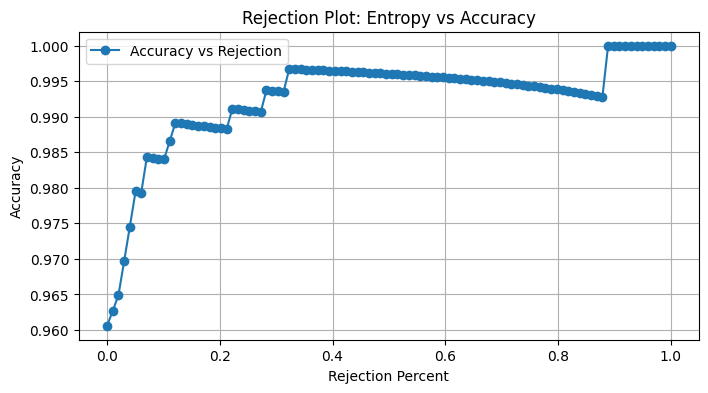

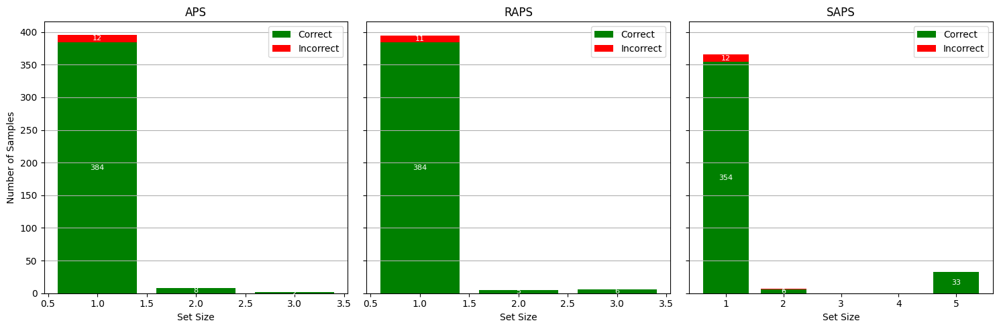

In [219]:
results_rejection = predictor_raps.rejection_plot(probs_test_single, y_test_single, num_points=100)


predictor_aps = ConformalPredictor(method='raps', lambda_param=0.0, k_reg=1, randomize=True)
predictor_aps.calibrate(cal_probs=probs_cal_single, cal_labels=y_cal_single, alpha=0.1)

predictor_raps = ConformalPredictor(method='raps', lambda_param=1.0, k_reg=2, randomize=True)
predictor_raps.calibrate(cal_probs=probs_cal_single, cal_labels=y_cal_single, alpha=0.1)

predictor_saps = ConformalPredictor(method='saps', lambda_param=1, k_reg=2, randomize=True)
predictor_saps.calibrate(cal_probs=probs_cal_single, cal_labels=y_cal_single, alpha=0.1)

predictor_dict = {
    'APS': predictor_aps,
    'RAPS': predictor_raps,
    'SAPS': predictor_saps
}

ConformalPredictor.plot_correct_incorrect_bars(predictor_dict, probs_test_single, y_test_single)



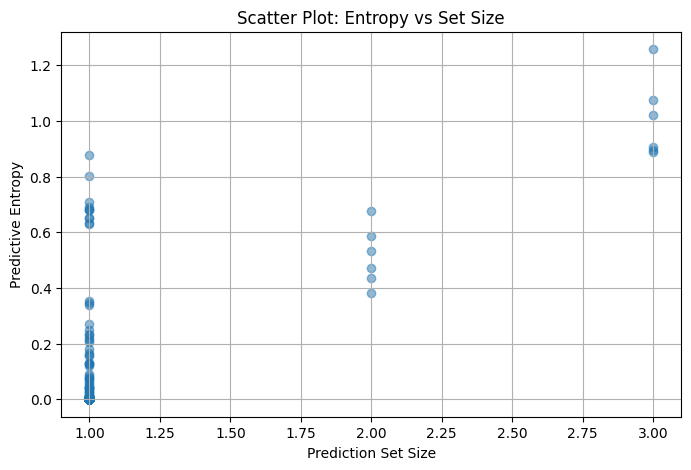

Spearman correlation: 0.28580686789309695 p-value: 4.522522293197261e-09
Kruskal-Wallis stat: 23.94958695652179 p-value: 6.301055000052582e-06
Spearman Correlation: 0.28580686789309695, p-value: 4.522522293197261e-09, Kruskal-Wallis stat: 23.94958695652179, p-value: 6.301055000052582e-06


In [223]:
metrics_setsize = predictor_raps.analyze_entropy_vs_set_size(probs_test_single, y_test_single)
print(f"Spearman Correlation: {metrics_setsize['spearman_corr']}, p-value: {metrics_setsize['spearman_p']}, Kruskal-Wallis stat: {metrics_setsize['kw_stat']}, p-value: {metrics_setsize['kw_p']}")

**Etape 6**

In [252]:
from torchcam.methods import GradCAM
from sklearn.metrics import roc_auc_score, average_precision_score
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image


class OODSaliencyEvaluator:
    def __init__(self, model, device, target_layer=None):
        """
        Initialise l'évaluateur pour les tâches OOD et saliency.
        
        Paramètres:
         - model: le modèle PyTorch pré-entraîné
         - device: device d'exécution (cpu ou cuda)
         - target_layer: la couche cible pour GradCAM (exemple: model.layer4)
        """
        self.model = model.to(device)
        self.device = device
        self.target_layer = target_layer

                
    def predictive_entropy(self, probs):
        return -np.sum(probs * np.log(probs + 1e-10))

    def evaluate_ood(self, id_probs, ood_probs, scoring_function=None):
        """
        Évalue la capacité du modèle à détecter des échantillons OOD.
        
        Paramètres:
         - id_probs: array de dimension (n_id, K) pour les échantillons in‑distribution
         - ood_probs: array de dimension (n_ood, K) pour les échantillons OOD
         - scoring_function: fonction qui transforme un vecteur de probabilités en score.
                              Par défaut, utilise l'entropie prédictive (plus l'entropie est élevée, 
                              plus l'échantillon est incertain et donc potentiellement OOD).
        Retourne un dictionnaire avec AUROC et AUPRC.
        """
        if scoring_function is None:
            scoring_function = self.predictive_entropy

        scores_id = np.array([scoring_function(probs) for probs in id_probs])
        scores_ood = np.array([scoring_function(probs) for probs in ood_probs])
        
        labels = np.concatenate([np.zeros(len(scores_id)), np.ones(len(scores_ood))])
        scores = np.concatenate([scores_id, scores_ood])
        
        auroc = roc_auc_score(labels, scores)
        auprc = average_precision_score(labels, scores)
        print(f"OOD Evaluation - AUROC: {auroc:.3f}, AUPRC: {auprc:.3f}")
        return {'auroc': auroc, 'auprc': auprc}

    def compute_saliency_maps(self, input_tensor, cam_method='gradcam'):
        self.model.eval()
        
        if input_tensor.dim() == 3:
            input_tensor = input_tensor.unsqueeze(0)
    
        if cam_method.lower() == 'gradcam':
            cam_extractor = GradCAM(model=self.model, target_layer=self.target_layer)
        elif cam_method.lower() == 'smoothgradcampp':
            cam_extractor = SmoothGradCAMpp(model=self.model, target_layer=self.target_layer)
        else:
            raise ValueError("Méthode CAM non supportée : " + cam_method)
        
        with torch.enable_grad():
            out = self.model(input_tensor)
            pred_class = out.argmax(dim=1).item()
            activation_map = cam_extractor(pred_class, out)
            cam_overlay = overlay_mask(
                to_pil_image(input_tensor.squeeze(0).cpu().clamp(0, 1)),
                to_pil_image(activation_map[0].squeeze(0), mode='F'),
                alpha=0.5
            )
        return {
            'cam_overlay': cam_overlay,
            'pred_class': pred_class,
            'activation_map': activation_map
        }
    
    def get_probs(self, data_loader):
        """
        Parcourt le data_loader et retourne un array de probabilités de dimension (n_samples, n_classes)
        """
        self.model.eval()
        all_probs = []
        with torch.no_grad():
            for batch in data_loader:
                if isinstance(batch, (list, tuple)):
                    inputs = batch[0]
                else:
                    inputs = batch
                inputs = inputs.to(self.device)
                outputs = self.model(inputs)
                probs = torch.softmax(outputs, dim=1)
                all_probs.append(probs.cpu().numpy())
        all_probs = np.concatenate(all_probs, axis=0)
        return all_probs

    def plot_saliency_maps(self, images, cam_results, titles=None):
        """
        Affiche les images originales et leurs saliency maps en deux colonnes.
        
        Paramètres:
         - images: liste (ou array) d'images originales sous forme de numpy arrays (format HxWx3, normalisées [0,1])
         - cam_results: liste de saliency maps (grayscale) de même dimension que l'image HxW
         - titles: optionnel, liste de titres pour chaque image
        """
        n = len(images)
        fig, axes = plt.subplots(n, 2, figsize=(10, 5*n))
        if n == 1:
            axes = np.array([axes])
        for i in range(n):
            axes[i, 0].imshow(images[i])
            axes[i, 0].set_title(titles[i] if titles is not None else f"Image {i}")
            axes[i, 0].axis("off")
            cam_overlay = overlay_mask(
                to_pil_image(images[i]),
                to_pil_image(cam_results[i].squeeze(0), mode='F'),
                alpha=0.5
            )
            axes[i, 1].imshow(cam_overlay)
            axes[i, 1].set_title(titles[i] if titles is not None else f"Saliency Map {i}")
            axes[i, 1].axis("off")
        plt.tight_layout()
        plt.show()

    # ---- Méthodes statiques pour télécharger des images et créer un dataset OOD ----
    @staticmethod
    def download_and_save_image(url, save_path):
        response = requests.get(url)
        if response.status_code == 200:
            with open(save_path, 'wb') as file:
                file.write(response.content)
        else:
            print(f"Échec du téléchargement de l'image depuis {url}. Code: {response.status_code}")

    @staticmethod
    def create_ood_dataset(image_urls, save_dir):
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)
        for i, url in enumerate(image_urls):
            image_name = (url.split("/")[-1]).split("-")[0] + ".jpg"
            save_path = os.path.join(save_dir, image_name)
            OODSaliencyEvaluator.download_and_save_image(url, save_path)
            print(f"Téléchargé et sauvegardé {image_name}")

    def get_image_tensors(self, image_dir):
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        imgs = []
        for filename in os.listdir(image_dir):
            image_path = os.path.join(image_dir, filename)
            img = Image.open(image_path).convert("RGB")
            img = transform(img)
            imgs.append(img)
        return torch.stack(imgs)

In [253]:
class ProbabilitiesExtractor:
    def __init__(self, model, device):
        """
        Initialise l'extracteur de probabilités pour un modèle donné.
        
        Paramètres:
         - model: le modèle PyTorch pré-entraîné
         - device: device d'exécution (cpu ou cuda)
        """
        self.model = model.to(device)
        self.device = device
        self.model.eval()
        
    def get_probs(self, data_loader):
        """
        Extrait les probabilités pour chaque image dans le data_loader.
        Retourne un tableau de probabilités (n_samples, K).
        """
        self.model.eval()
        all_probs = []
        
        with self.model.no_grad():
            for batch in data_loader:
                images, _ = batch
                images = images.to(self.device)
                logits = self.model(images)
                probs = torch.nn.Softmax(dim=1)(logits)
                all_probs.append(probs.cpu().numpy())
        all_probs = np.concatenate(all_probs, axis=0)
        return all_probs
    
    

Téléchargé et sauvegardé lemons.jpg
Téléchargé et sauvegardé butterfly.jpg


Téléchargé et sauvegardé roche.jpg


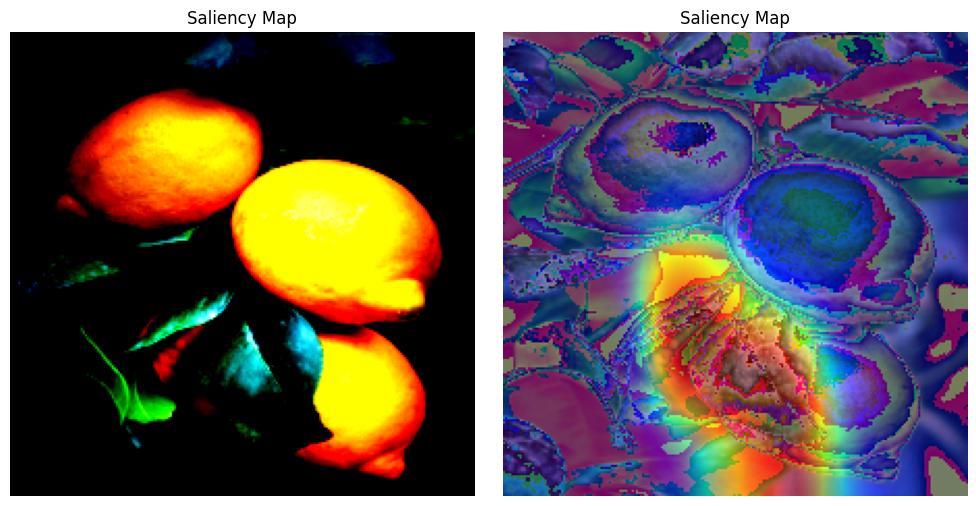

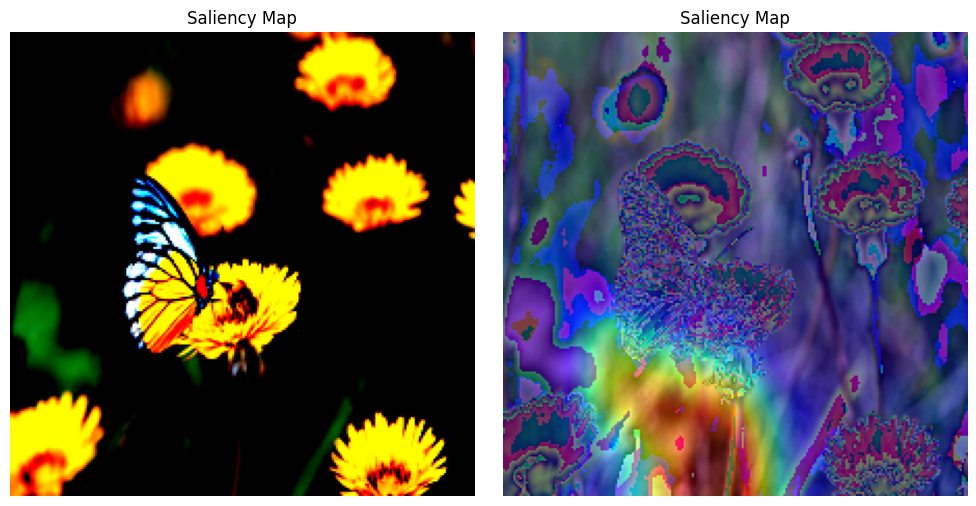

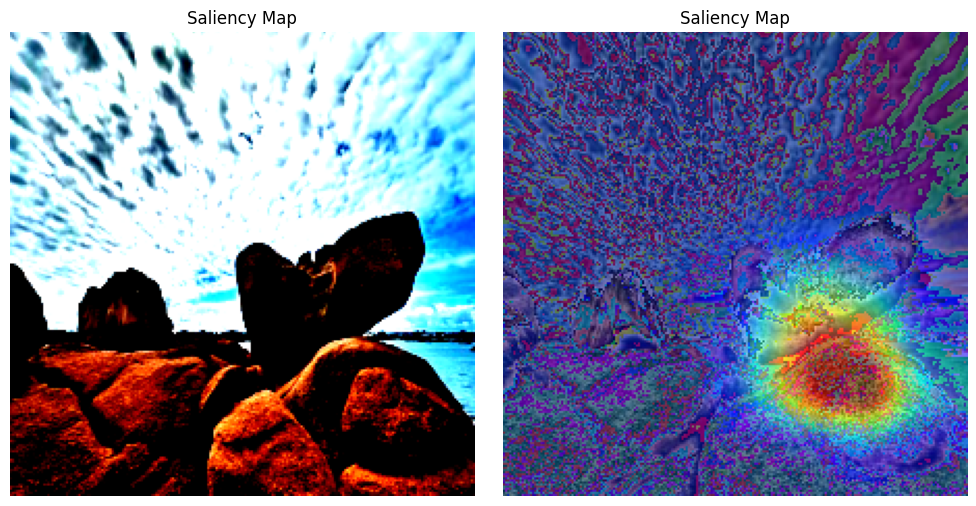

In [254]:
finetuned_model_single = finetuned_model_single.to(device)
ood_dataset_dir = "ood_dataset"
image_urls = [
    "https://cdn.pixabay.com/photo/2024/02/24/17/37/lemons-8594421_1280.jpg",
    "https://cdn.pixabay.com/photo/2022/04/05/17/06/butterfly-7114037_640.jpg",
    "https://cdn.pixabay.com/photo/2025/03/21/21/22/roche-9485693_640.jpg"
]

oodsaliency_evaluator = OODSaliencyEvaluator(finetuned_model_single, device, target_layer=finetuned_model_single.model.layer4[2].conv3)
oodsaliency_evaluator.create_ood_dataset(image_urls, ood_dataset_dir)
imgs_tensors = oodsaliency_evaluator.get_image_tensors(ood_dataset_dir)
for img_tensor in imgs_tensors:
    results_saliency_map = oodsaliency_evaluator.compute_saliency_maps(img_tensor, cam_method='gradcam')
    oodsaliency_evaluator.plot_saliency_maps([img_tensor.cpu().numpy().transpose(1, 2, 0)], results_saliency_map['activation_map'], titles=["Saliency Map"])